In [ ]:
%load_ext cudf.pandas
import pandas as pd
import numpy as np

In [ ]:
import requests
from io import StringIO
from datetime import datetime
import os
import matplotlib.pyplot as plt

# Data Preprocessing


# LOADING DATASET


## acessing the dataset after loading


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os, glob, pandas as pd

DATA_DIR = '/content/drive/MyDrive/Colab Notebooks/telecom_data_check'

In [ ]:
csv_paths = sorted(glob.glob(os.path.join(DATA_DIR, '*.csv')))
print(f'🗂️  Found {len(csv_paths)} weekly files')


🗂️  Found 9 weekly files


In [ ]:
csv_paths

['/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_1.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_2.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_3.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_4.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_5.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_6.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_7.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_8.csv',
 '/content/drive/MyDrive/Colab Notebooks/telecom_data_check/week_9.csv']

In [ ]:
# Load each CSV into a separate variable
for i, path in enumerate(csv_paths, start=1):
    globals()[f"week_{i}"] = pd.read_csv(path)

# Example: show the first few rows of week_1
week_1.head()


In [ ]:
week_1.describe()

,CellID,datetime,countrycode,smsin,smsout,callin,callout,internet
count,3.762290e+07,3.762290e+07,3.762290e+07,2.015639e+07,1.164307e+07,1.136633e+07,1.607341e+07,1.881068e+07
mean,5.254895e+03,1.383583e+12,1.854582e+02,2.257395e+00,2.207828e+00,2.656719e+00,2.154600e+00,3.655456e+01
std,2.748042e+03,1.733316e+08,2.904913e+03,5.927244e+00,5.592025e+00,6.883280e+00,6.469558e+00,9.973139e+01
min,1.000000e+00,1.383260e+12,0.000000e+00,2.331498e-06,2.331498e-06,2.331498e-06,2.331498e-06,2.331498e-06
25%,3.057000e+03,1.383429e+12,2.000000e+01,1.505390e-01,1.513033e-01,1.157594e-01,7.400693e-02,8.754884e-02
50%,5.370000e+03,1.383589e+12,3.900000e+01,5.901342e-01,5.790800e-01,5.521602e-01,3.118383e-01,3.874875e+00
75%,7.521000e+03,1.383735e+12,4.600000e+01,2.019160e+00,1.972325e+00,2.335736e+00,1.511754e+00,3.315552e+01
max,1.000000e+04,1.383865e+12,9.725900e+04,6.320732e+02,5.944885e+02,2.628877e+02,3.011467e+02,7.936265e+03


In [ ]:
week_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37622898 entries, 0 to 37622897
Data columns (total 8 columns):
 #   Column       Dtype  
---  ------       -----  
 0   CellID       int64  
 1   datetime     int64  
 2   countrycode  int64  
 3   smsin        float64
 4   smsout       float64
 5   callin       float64
 6   callout      float64
 7   internet     float64
dtypes: float64(5), int64(3)
memory usage: 2.2 GB


In [ ]:
def preprocess(df, cells):
    # Convert milliseconds to datetime
    df['time'] = pd.to_datetime(df['datetime'], unit='ms')

    # Fill NaNs in individual traffic features
    cols = ['internet', 'smsin', 'smsout', 'callin', 'callout']
    df[cols] = df[cols].fillna(0.0).astype('float32')

    # Compute total traffic volume
    df['tot_vol'] = df[cols].sum(axis=1)

    # Create full time index
    full_times = pd.date_range(start=df['time'].min(), end=df['time'].max(), freq='10min')

    # Group by CellID and time
    grouped_df = df.groupby(['CellID', 'time'], as_index=False)['tot_vol'].sum()

    # Create MultiIndex (full grid)
    mux = pd.MultiIndex.from_product([cells, full_times], names=['CellID', 'time'])

    # Reindex to full grid (introduces NaNs)
    df_full = grouped_df.set_index(['CellID', 'time']).reindex(mux)

    # Interpolate missing values (per CellID)
    df_interp = (
        df_full
        .groupby(level='CellID', group_keys=False)
        .apply(lambda g: g.interpolate(method='linear'))
        .reset_index()
    )

    #Fill any remaining NaNs (at the edges) after interpolation
    df_interp['tot_vol'] = df_interp['tot_vol'].ffill().bfill().astype('float32')

    return df_interp


In [ ]:
cells = np.arange(1, 10001)
for i in range(len(csv_paths)):
  print("week", i+1)
  globals()[f"df_{i+1}"] = preprocess(pd.read_csv(csv_paths[i]), cells)

week 1
week 2
week 3
week 4
week 5
week 6
week 7
week 8
week 9


In [ ]:
for i in range(len(csv_paths)):
  # print(i+1, globals()[f'df_{i+1}']['time'].min(), globals()[f'df_{i+1}']['time'].max())
  print(i+1, globals()[f'df_{i+1}'].isna().sum())
  print(i+1, globals()[f'df_{i+1}'][globals()[f'df_{i+1}']['tot_vol']==0])

1 CellID     0
time       0
tot_vol    0
dtype: int64
1 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
2 CellID     0
time       0
tot_vol    0
dtype: int64
2 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
3 CellID     0
time       0
tot_vol    0
dtype: int64
3 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
4 CellID     0
time       0
tot_vol    0
dtype: int64
4 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
5 CellID     0
time       0
tot_vol    0
dtype: int64
5 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
6 CellID     0
time       0
tot_vol    0
dtype: int64
6 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
7 CellID     0
time       0
tot_vol    0
dtype: int64
7 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
8 CellID     0
time       0
tot_vol    0
dtype: int64
8 Empty DataFrame
Columns: [CellID, time, tot_vol]
Index: []
9 CellID     0
time       0
tot_vol    0
dtype: int64
9 Empty DataFrame
Columns:

In [ ]:
del globals()['week_1']
del globals()['week_2']
del globals()['week_3']
del globals()['week_4']
del globals()['week_5']
del globals()['week_6']
del globals()['week_7']


In [ ]:
weeks = [df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9]

def plot_cell_traffic(weeks, cell_id):
    """
    Plots the traffic volume (tot_vol) for a given cell_id.

    Parameters:
    - weeks: list of weekly DataFrames (each with columns 'CellID', 'time', 'tot_vol')
    - cell_id: integer CellID to visualize
    """
    combined_data = []

    # Plot combined line plot
    plt.figure(figsize=(30, 10))
    for i, df in enumerate(weeks, 1):
        if 'time' not in df.columns or 'tot_vol' not in df.columns:
            print(f"Skipping df_{i}: missing required columns.")
            continue

        cell_df = df[df['CellID'] == cell_id].copy()
        if cell_df.empty:
            print(f"No data for CellID {cell_id} in week {i}")
            continue

        cell_df = cell_df.sort_values('time')
        plt.plot(cell_df['time'], cell_df['tot_vol'], label=f'Week {i}', linewidth=1)
        cell_df['week'] = f'week_{i}'
        combined_data.append(cell_df)

    plt.title(f'Combined Traffic Volume for CellID {cell_id}')
    plt.xlabel('Time')
    plt.ylabel('Total Volume')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot separate line plots
    for i, df in enumerate(weeks, 1):
        if 'time' not in df.columns or 'tot_vol' not in df.columns:
            continue
        cell_df = df[df['CellID'] == cell_id].copy()
        if cell_df.empty:
            continue
        cell_df = cell_df.sort_values('time')

        plt.figure(figsize=(12, 4))
        plt.plot(cell_df['time'], cell_df['tot_vol'], marker='.', linestyle='-', linewidth=1)
        plt.title(f'Week {i} - Traffic Volume for CellID {cell_id}')
        plt.xlabel('Time')
        plt.ylabel('Total Volume')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


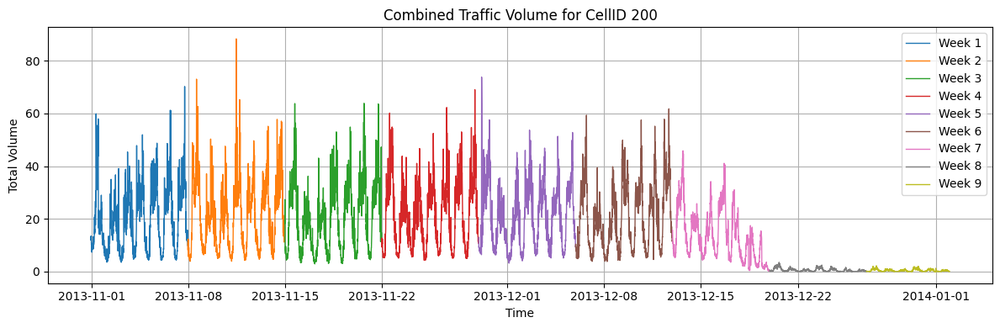

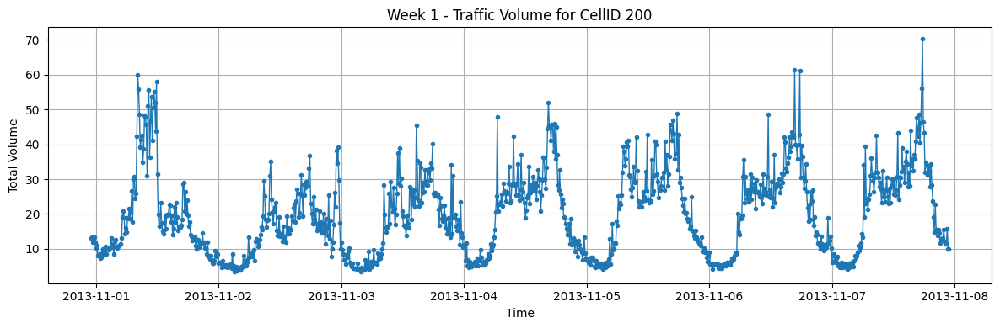

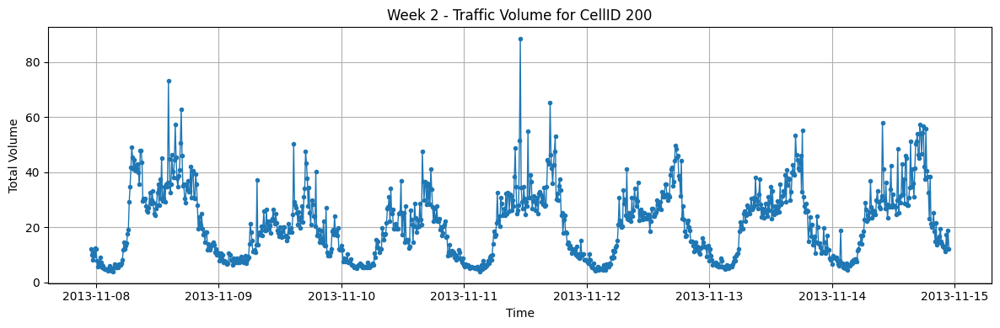

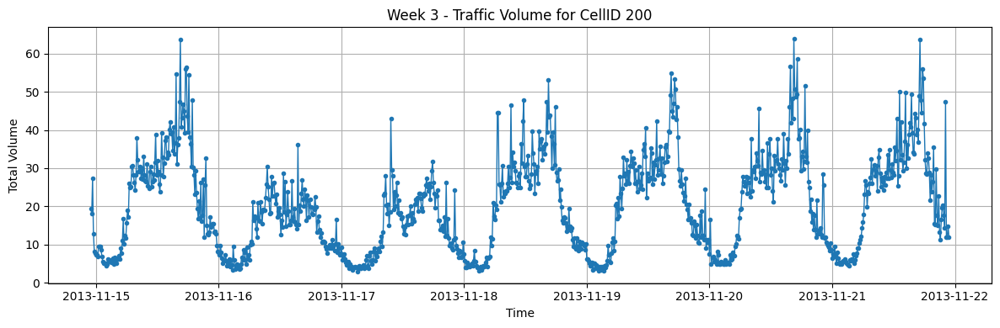

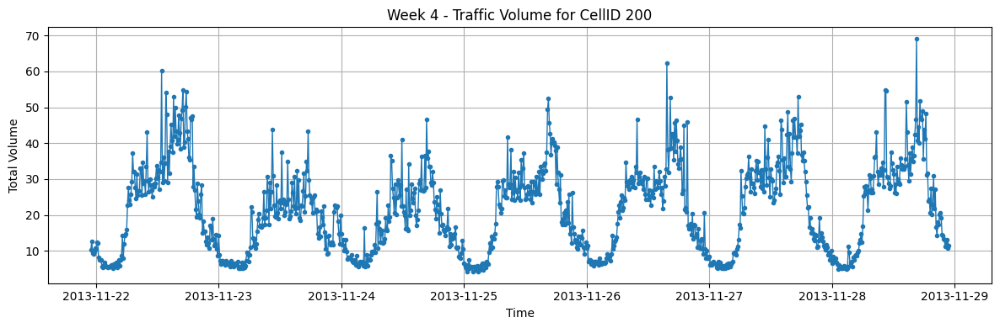

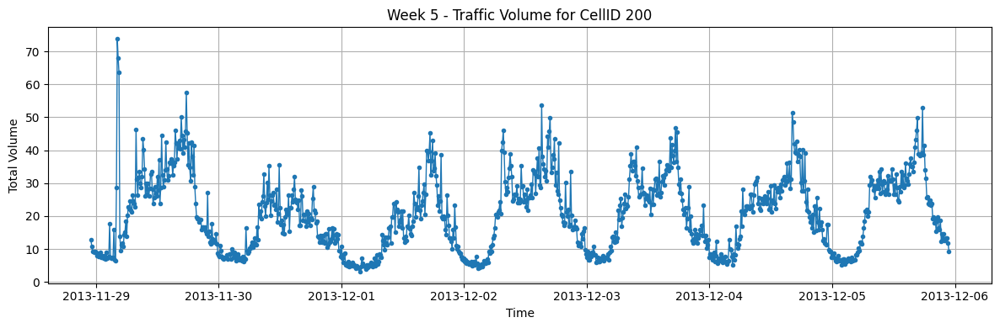

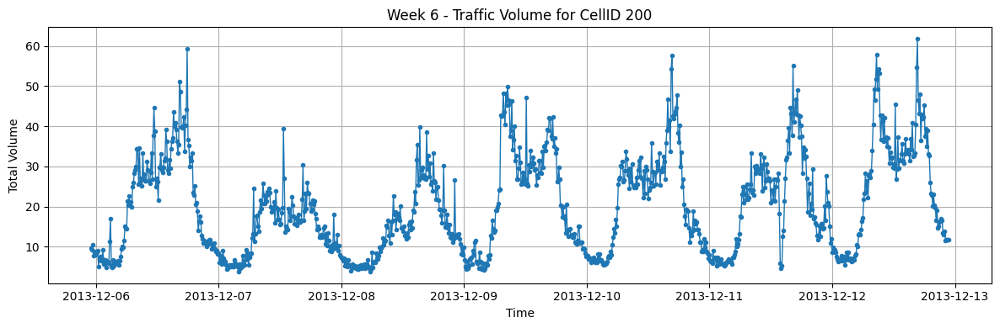

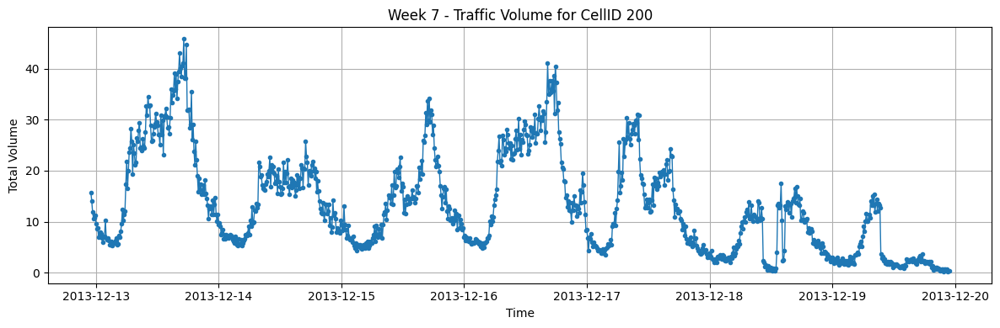

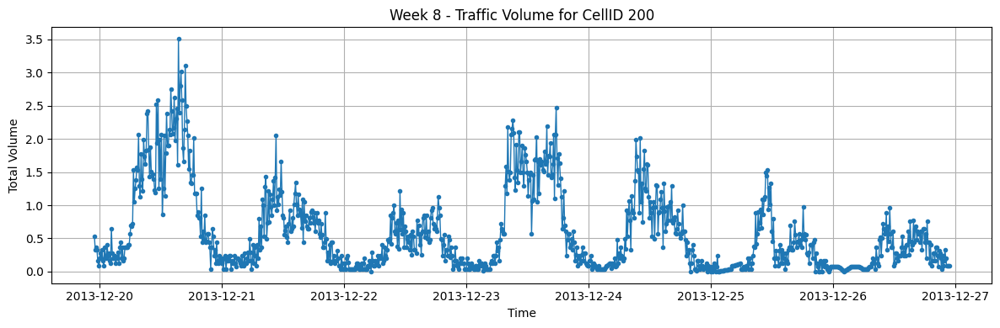

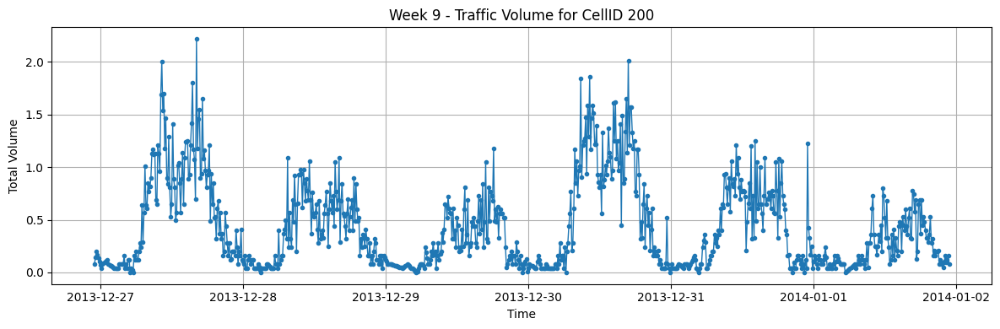

In [ ]:


# To plot for CellID 200
plot_cell_traffic(weeks, 200)


#### Bocconi


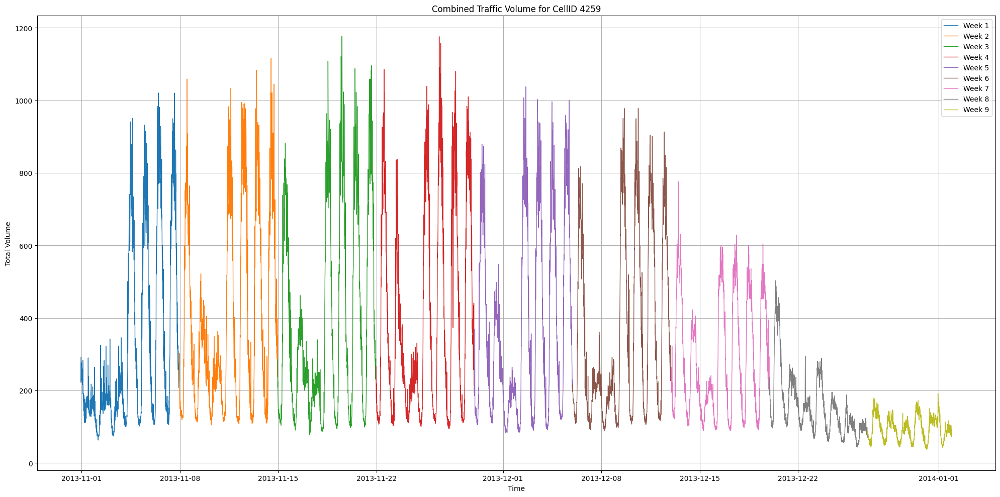

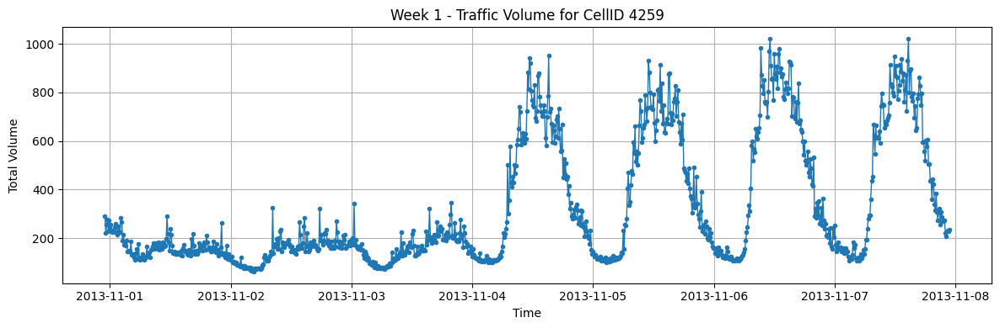

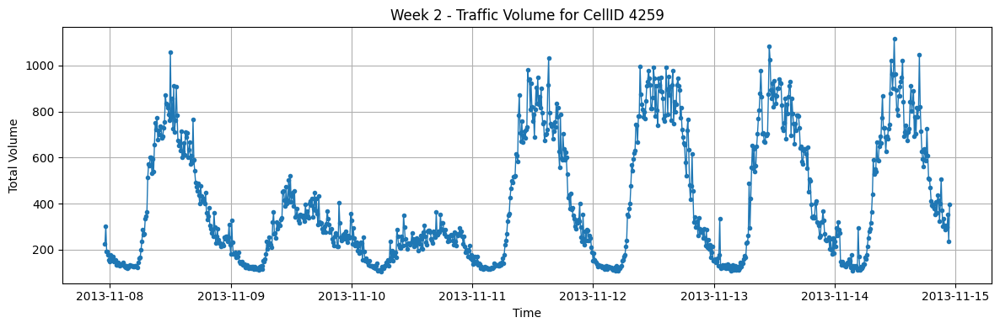

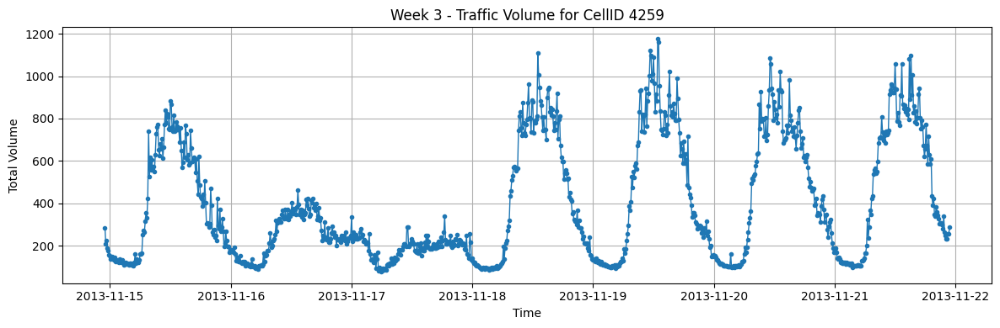

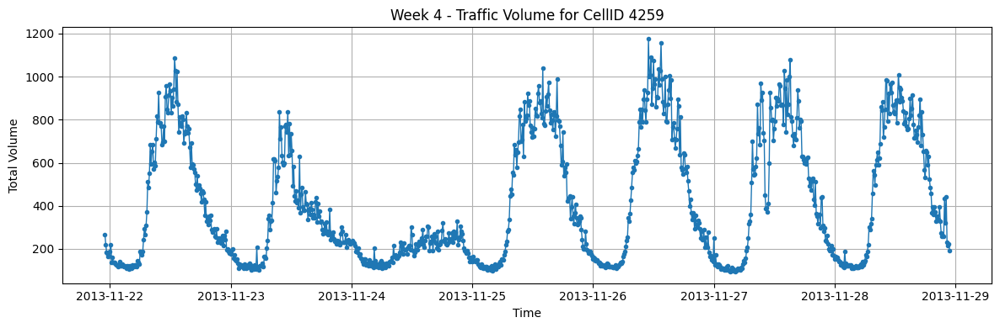

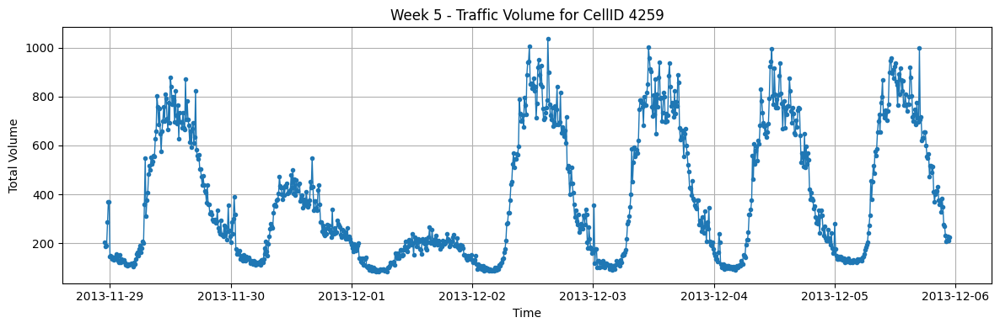

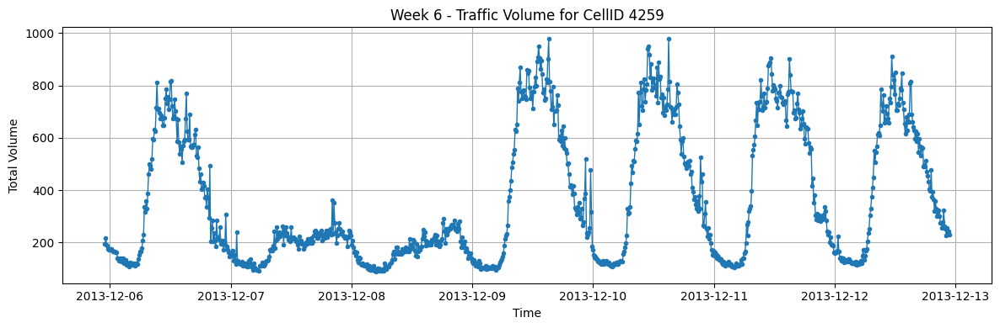

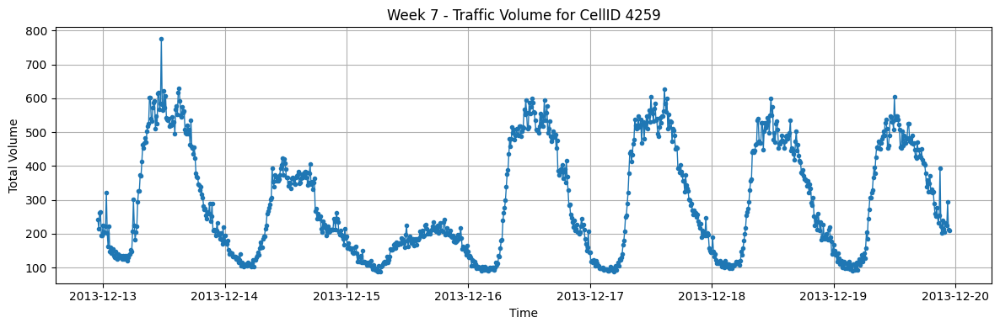

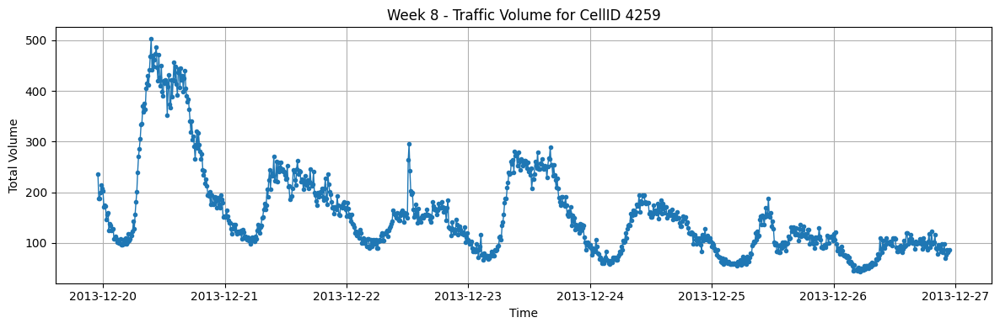

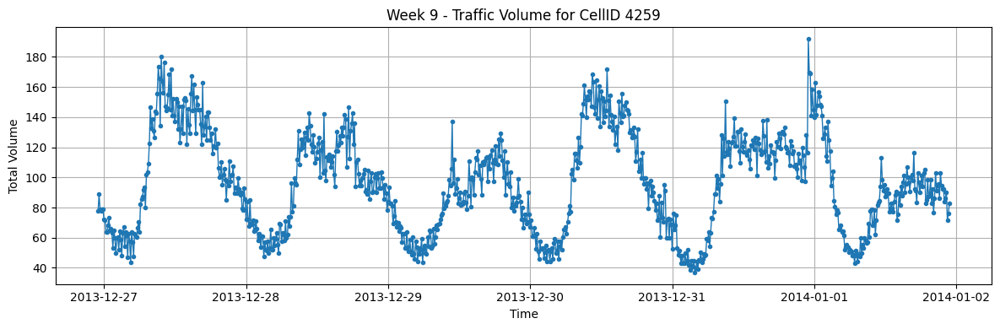

In [ ]:
plot_cell_traffic(weeks, 4259)

#### Navigli district, one of the most famous nightlife places in Milan (Square id: 4456);


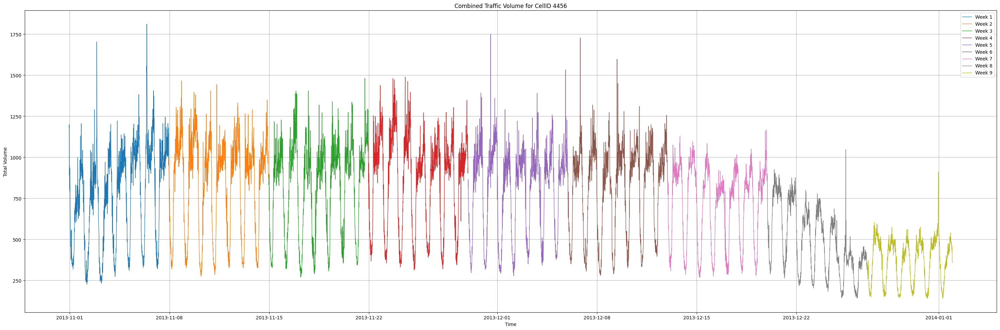

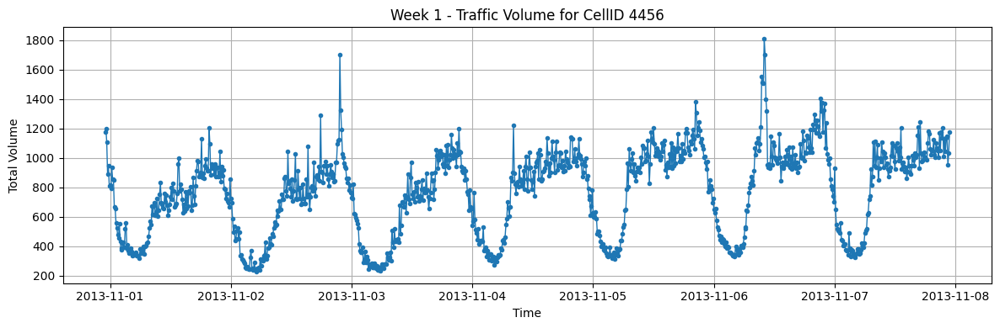

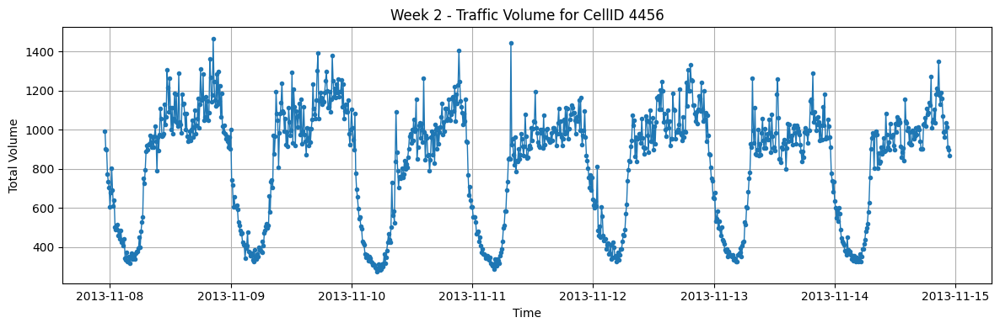

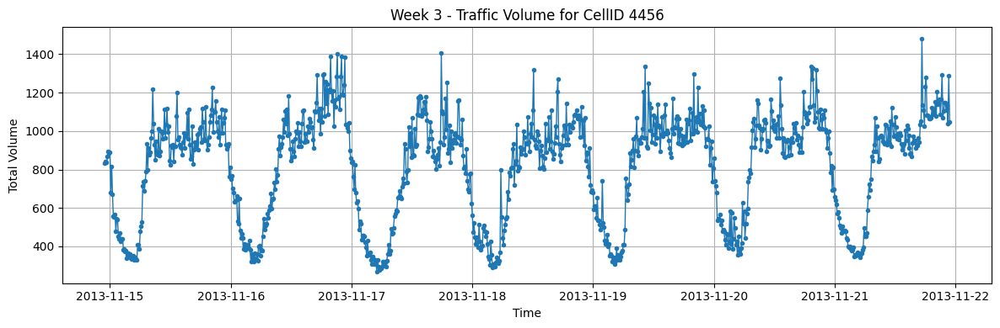

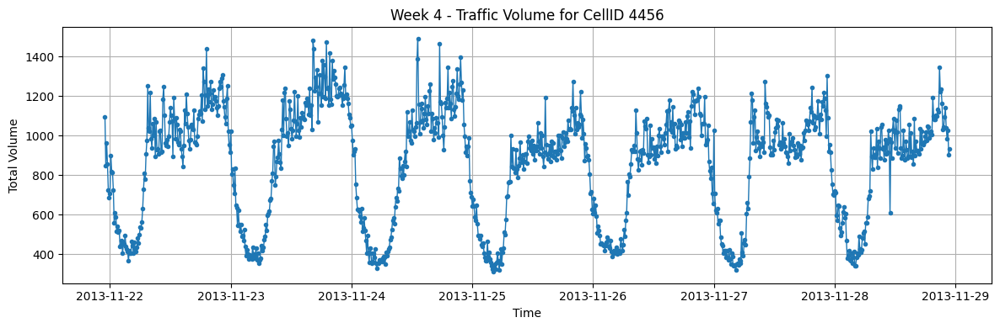

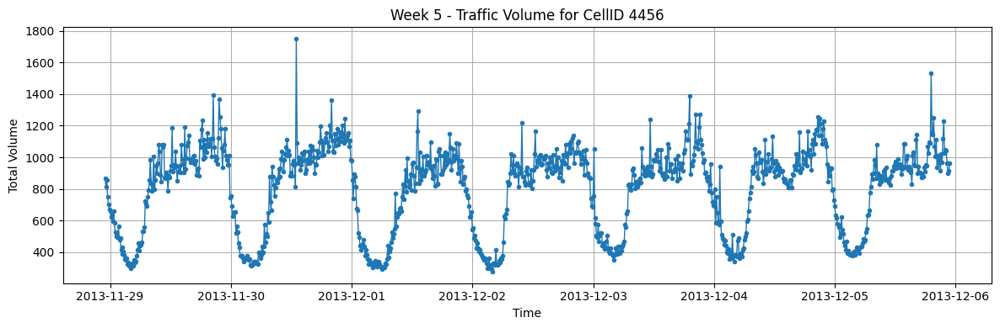

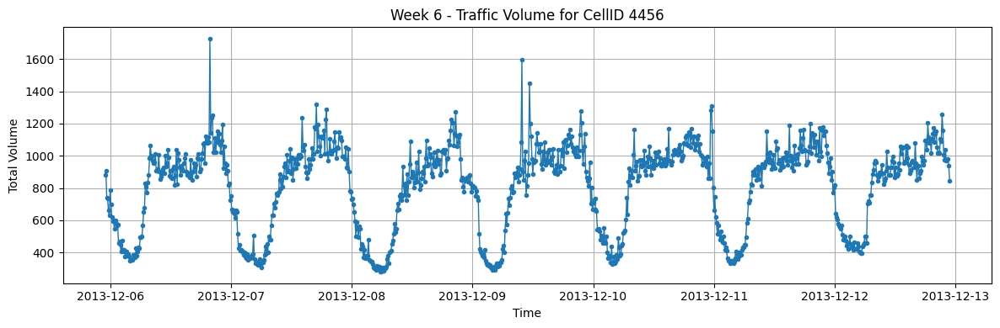

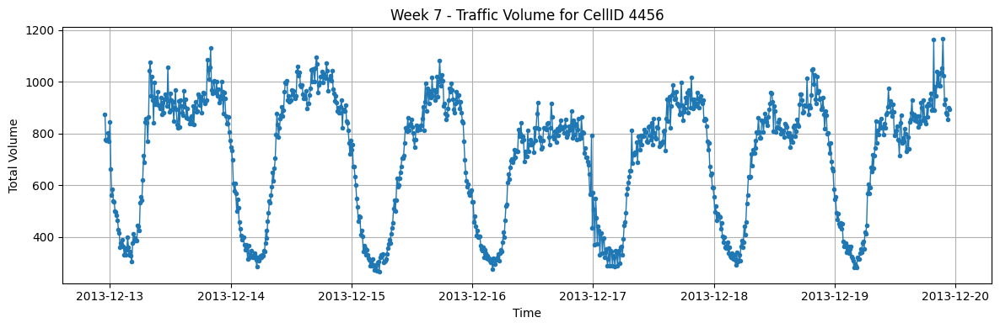

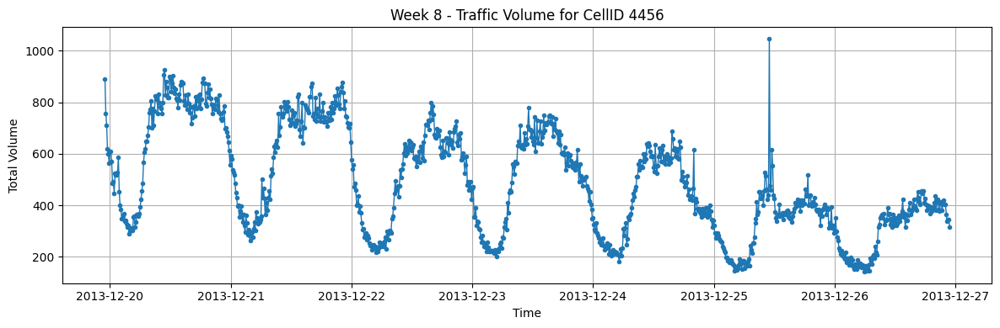

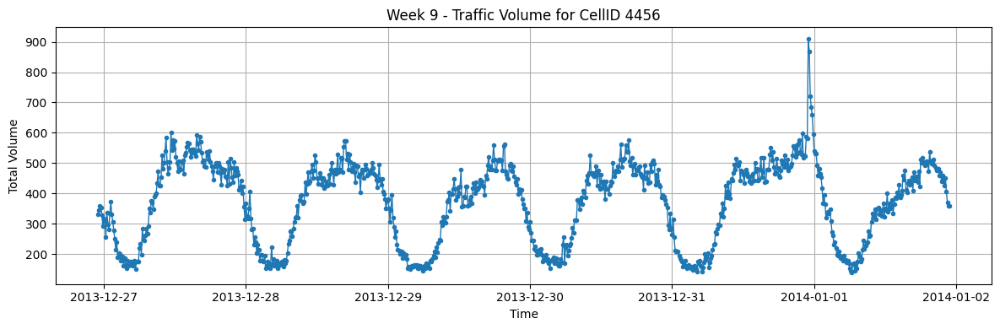

In [ ]:
plot_cell_traffic(weeks, 4456)

-   fun insight : their night isn't so nighty


#### Duomo, the city centre of Milan (Square id: 5060);


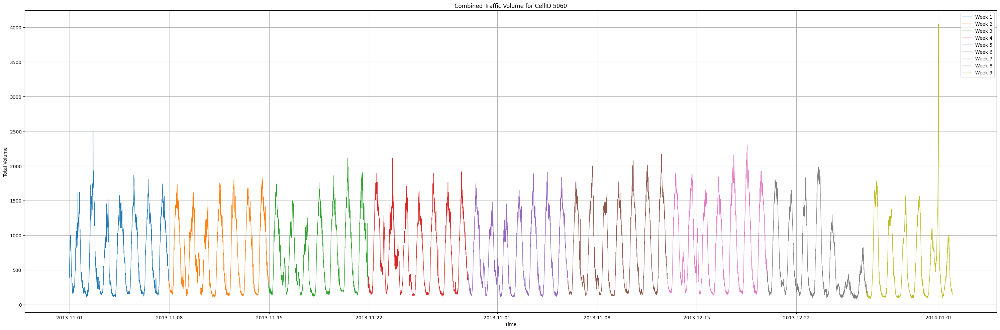

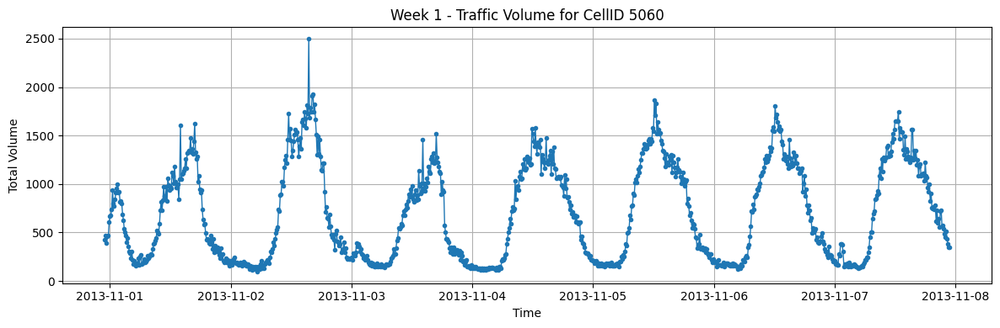

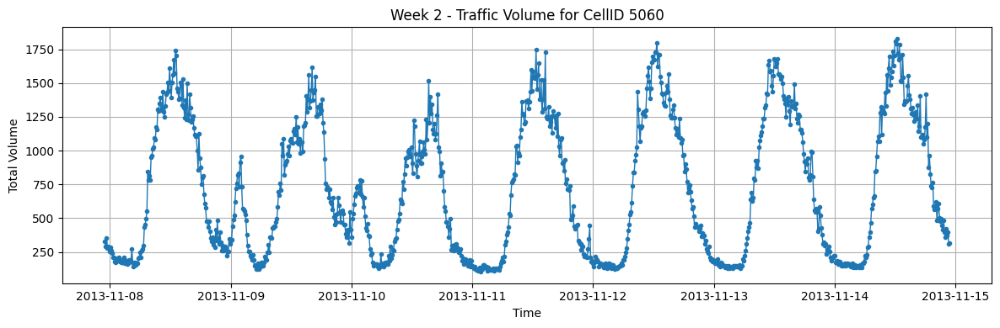

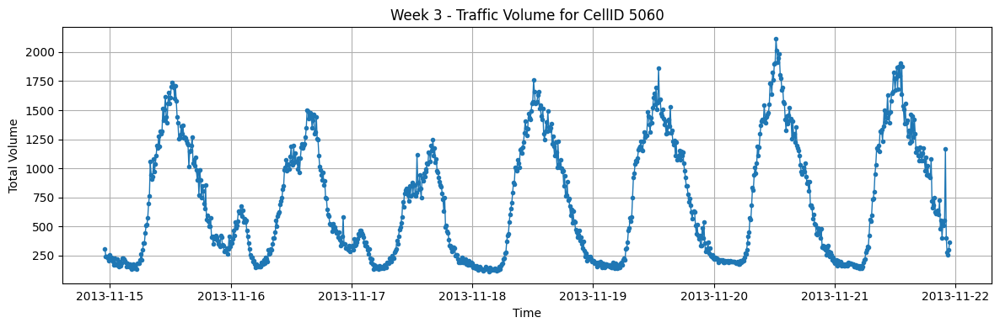

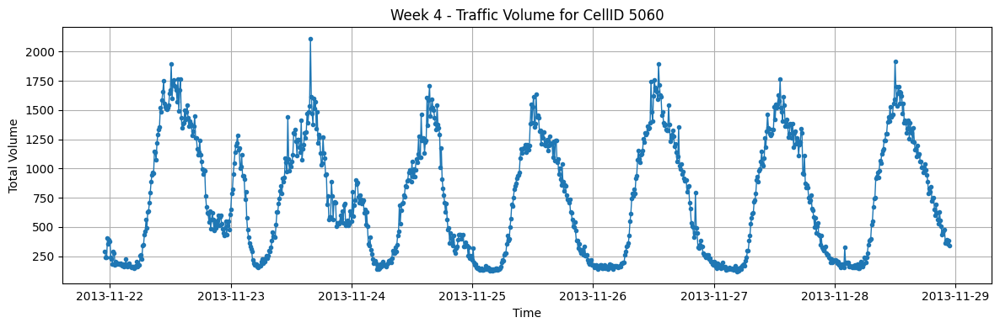

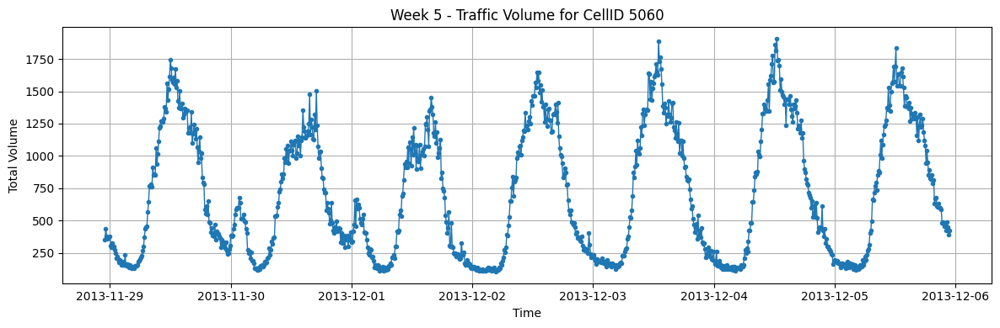

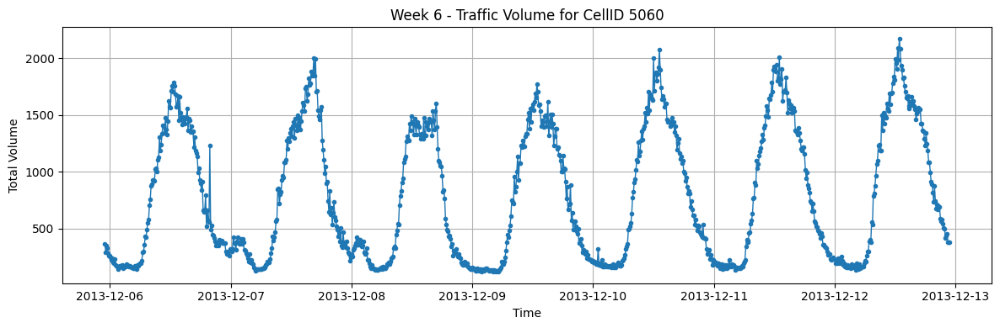

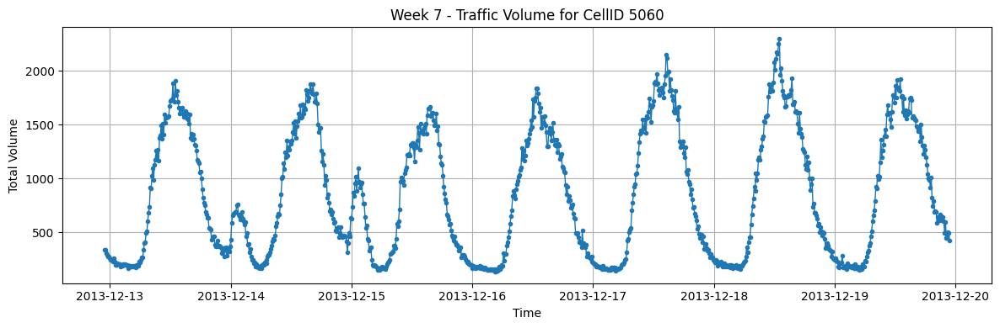

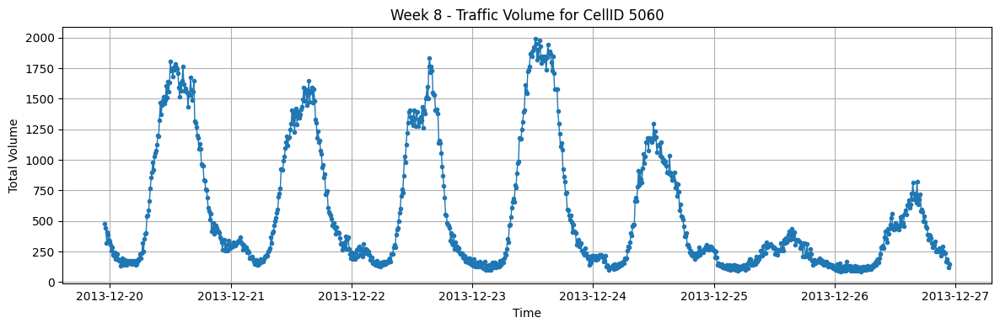

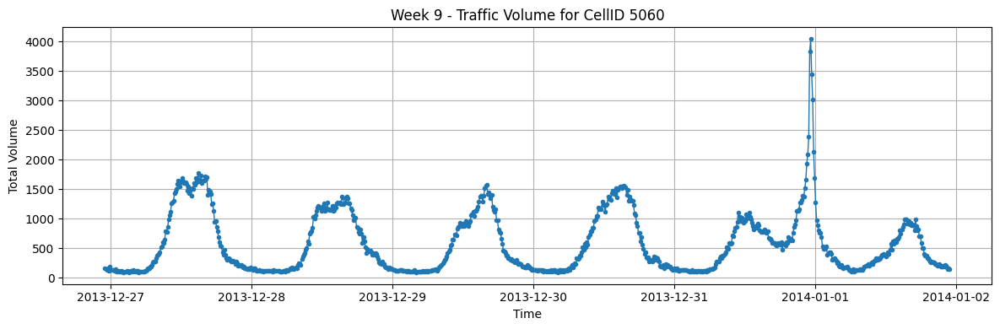

In [ ]:
plot_cell_traffic(weeks, 5060)

#### Mesiano, the department of Engineering of the University of Trento (Square id: 5085);


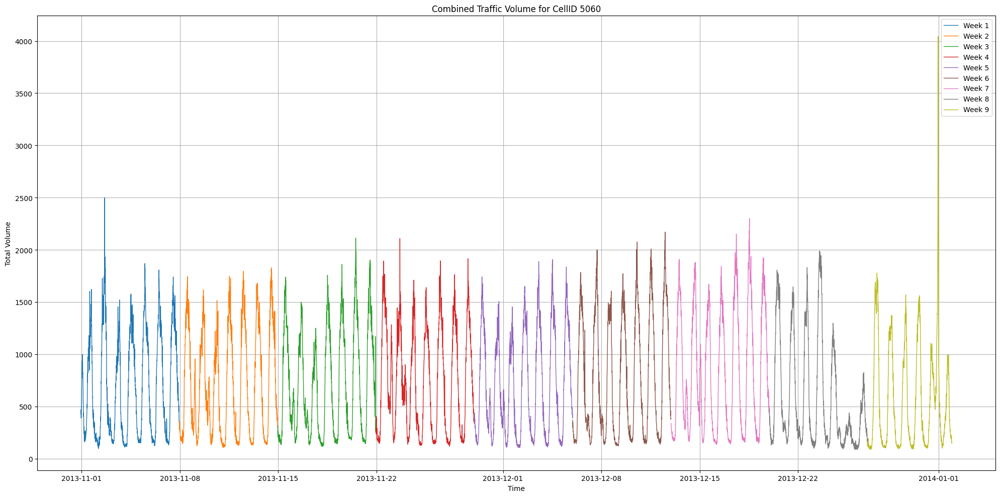

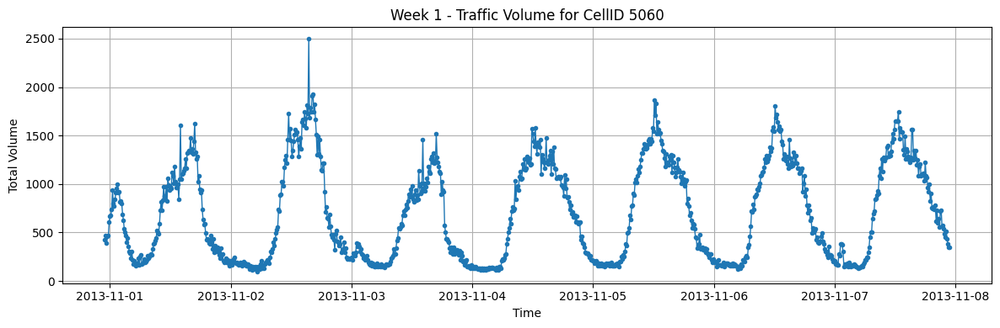

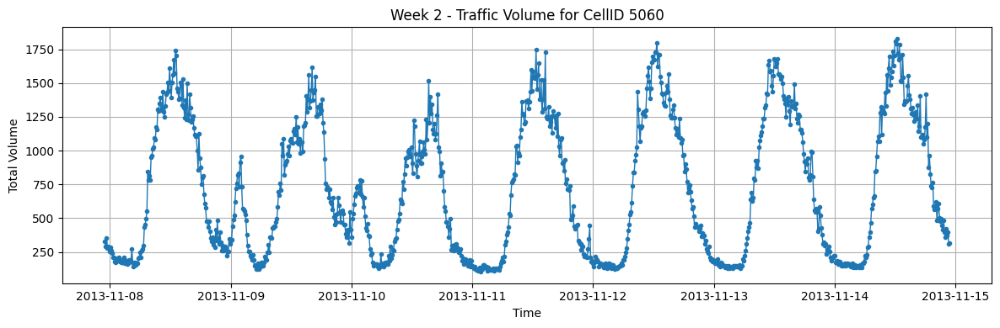

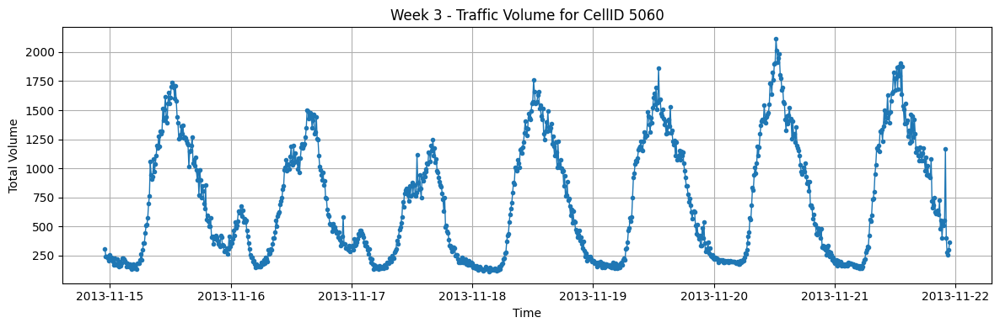

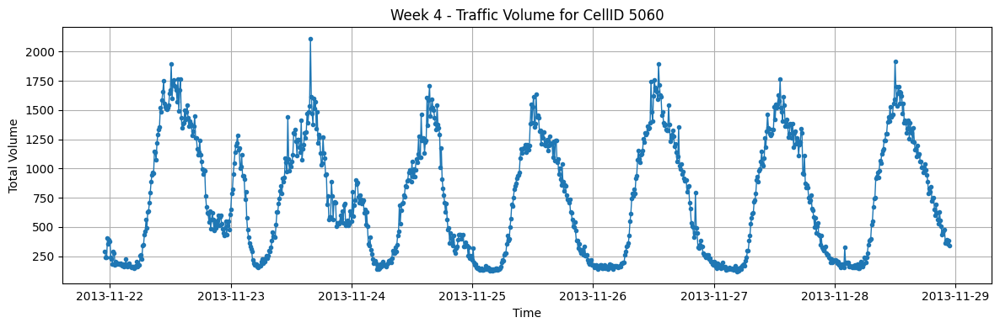

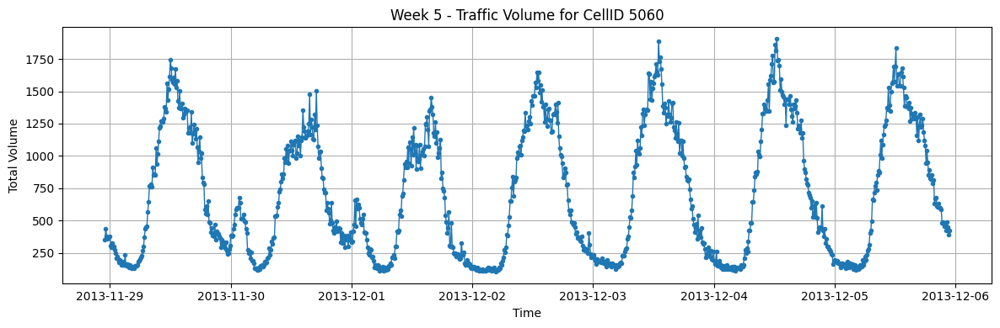

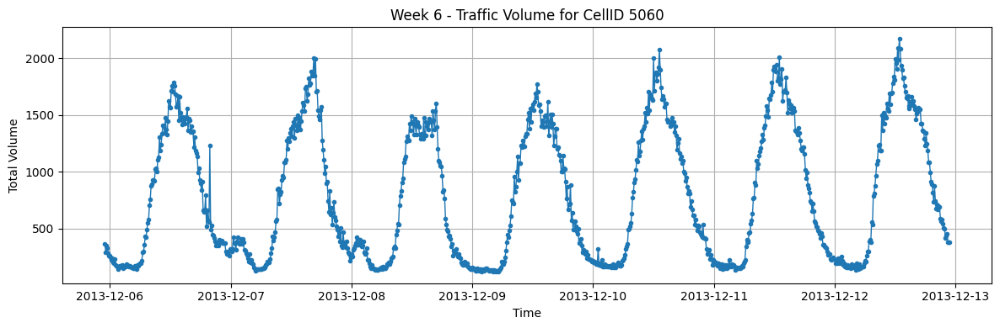

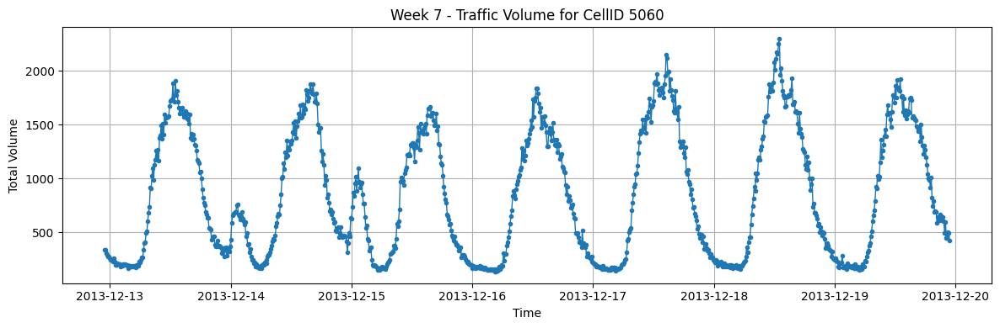

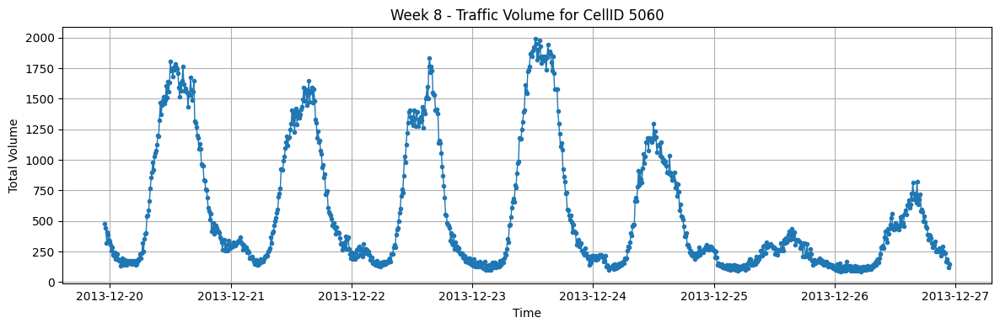

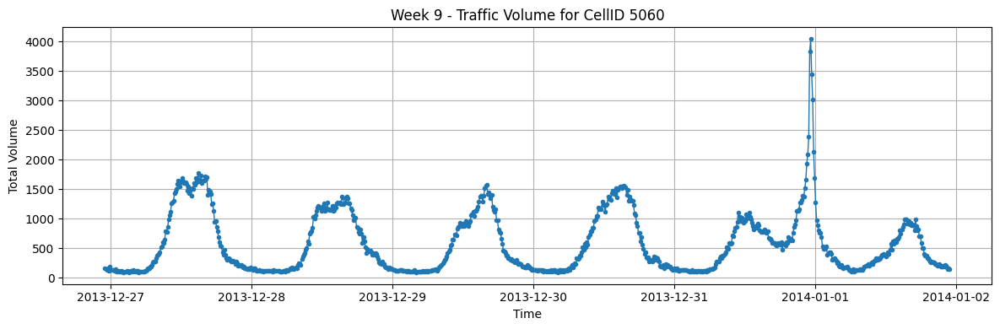

In [ ]:
plot_cell_traffic(weeks, 5060)

-   another fun insight : this city have strict hardworking people (sleep early)


#### Bosco della città, a forest near Trento (Square id: 4703).


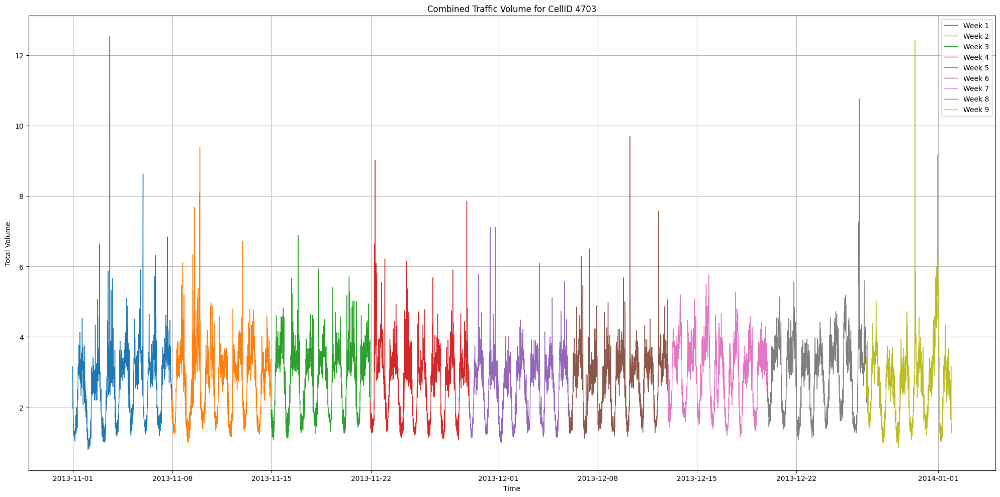

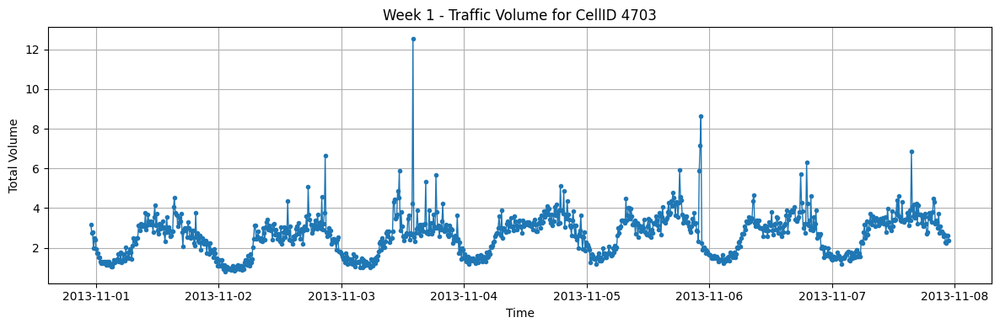

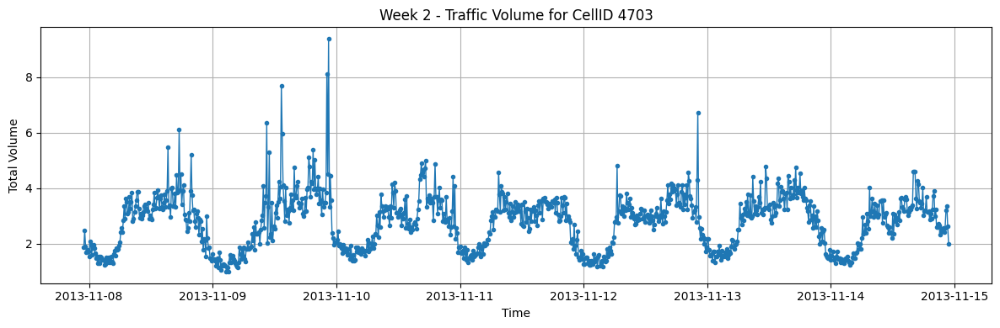

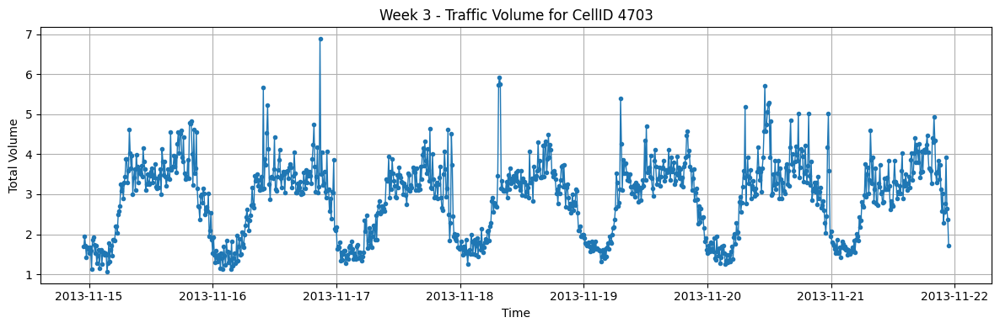

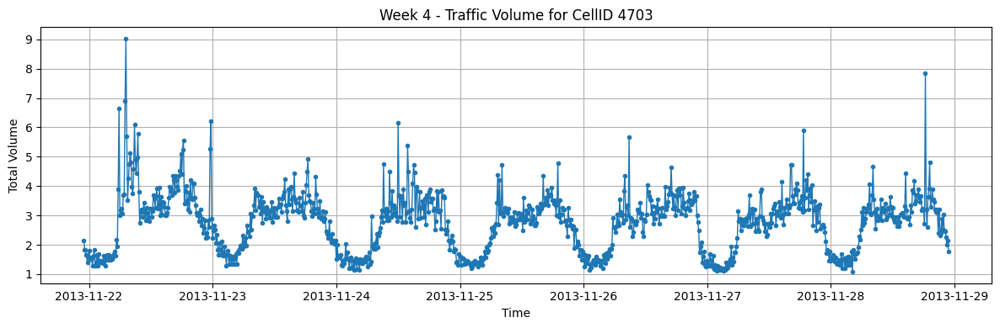

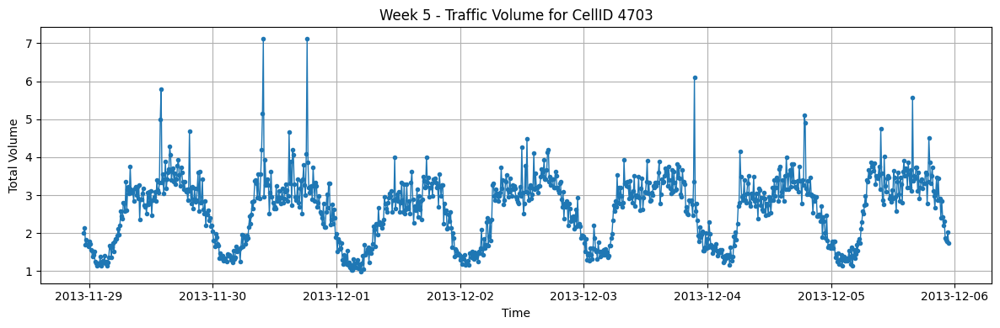

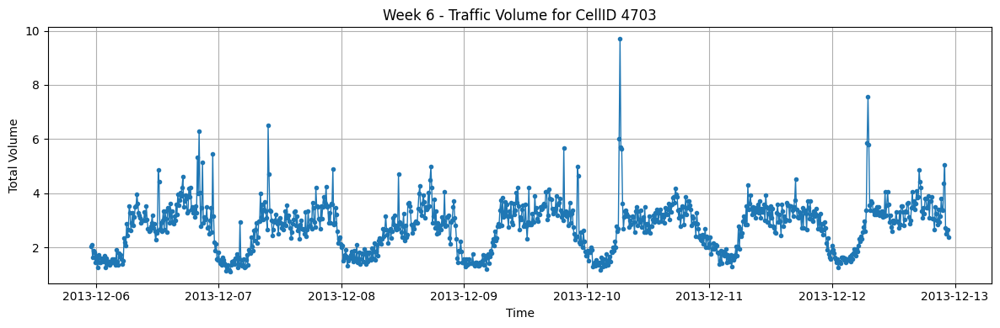

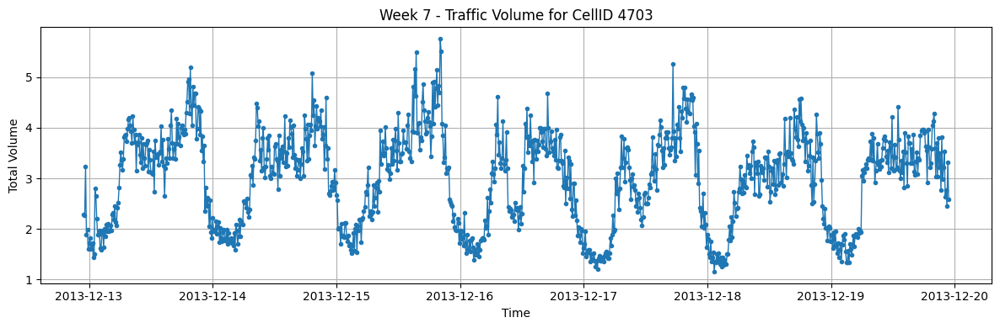

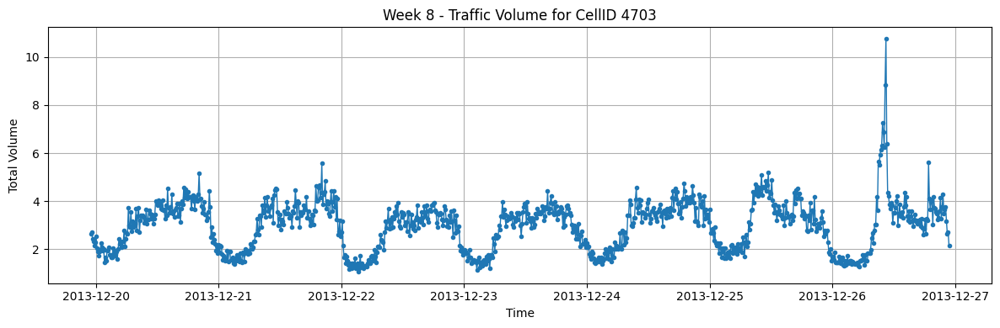

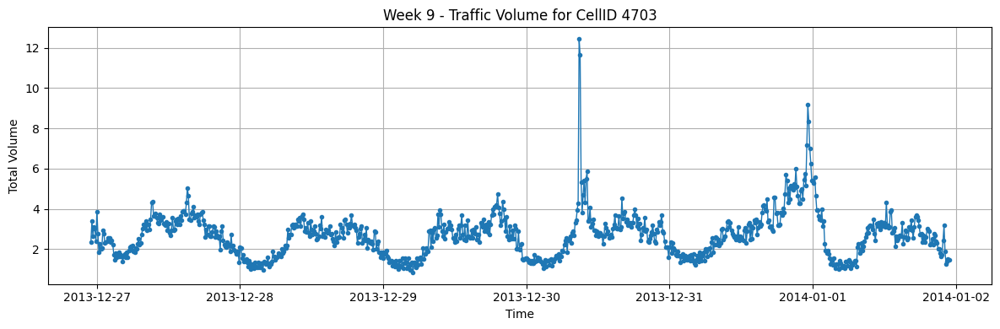

In [ ]:
plot_cell_traffic(weeks, 4703)

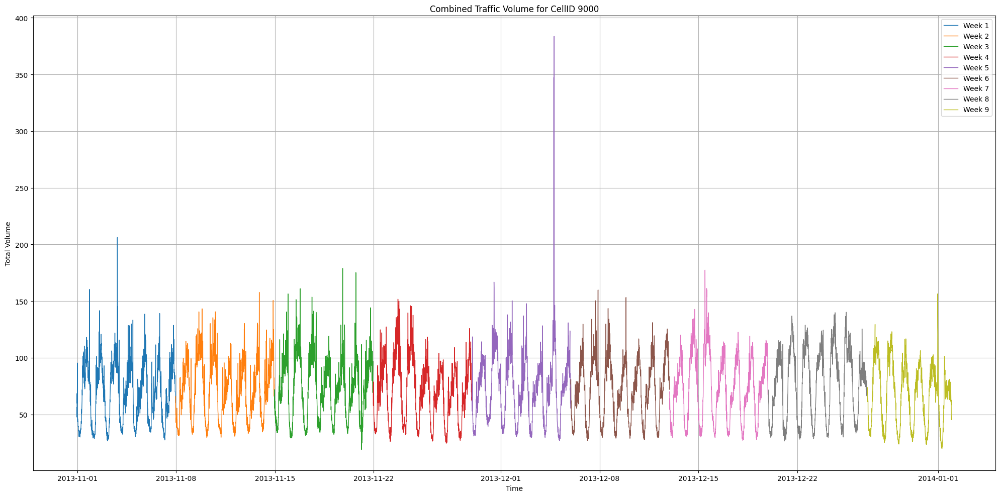

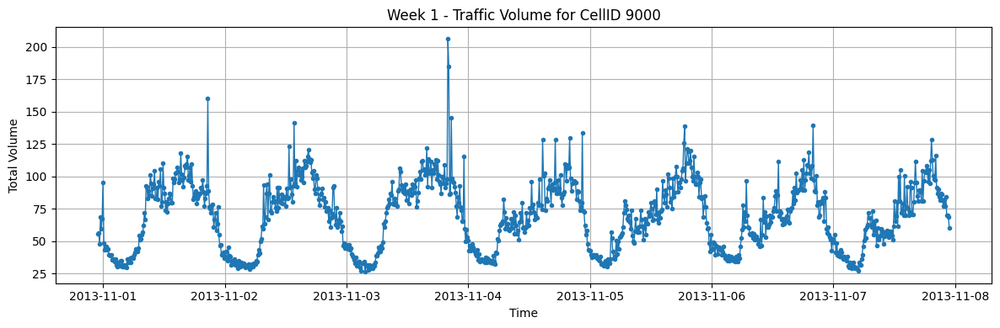

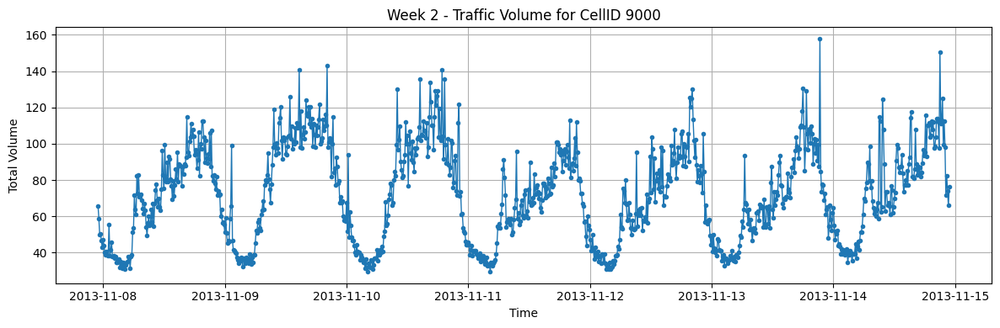

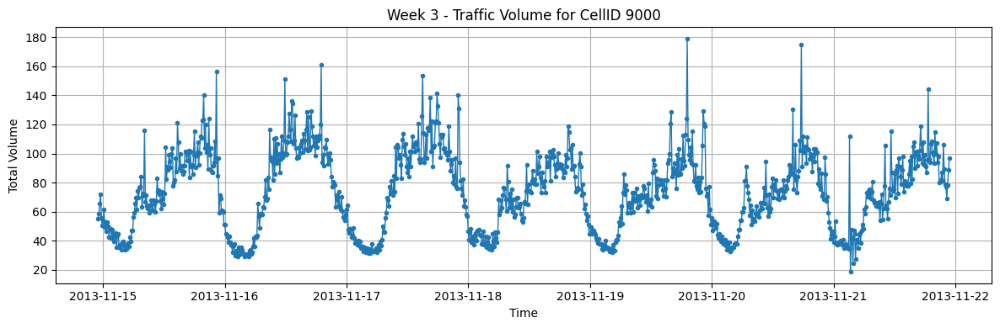

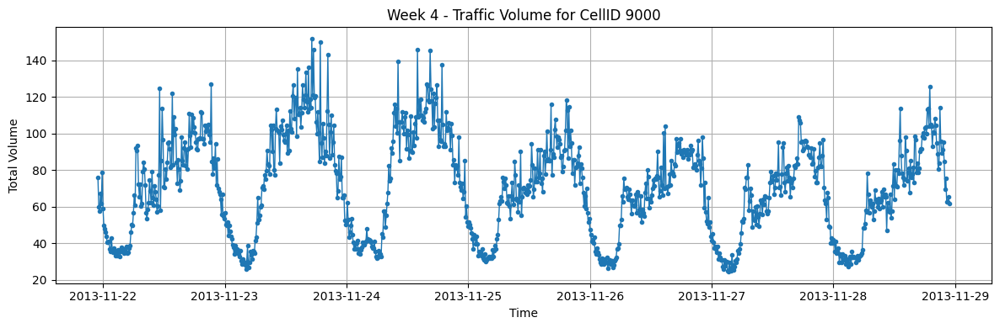

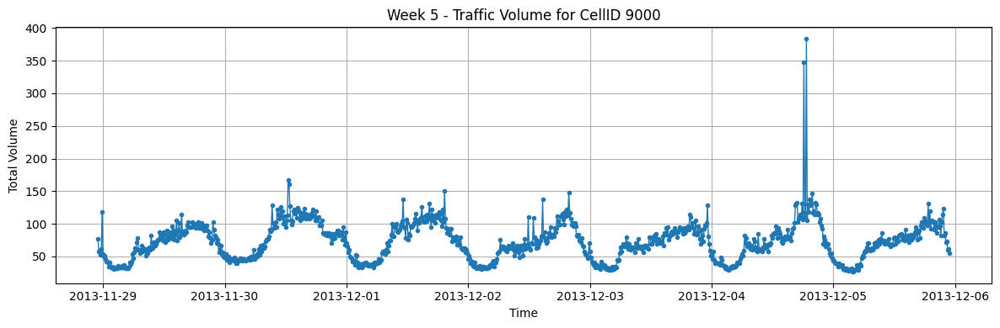

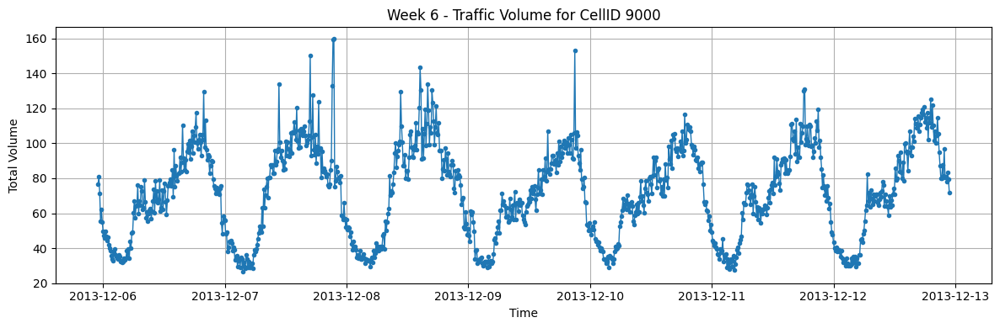

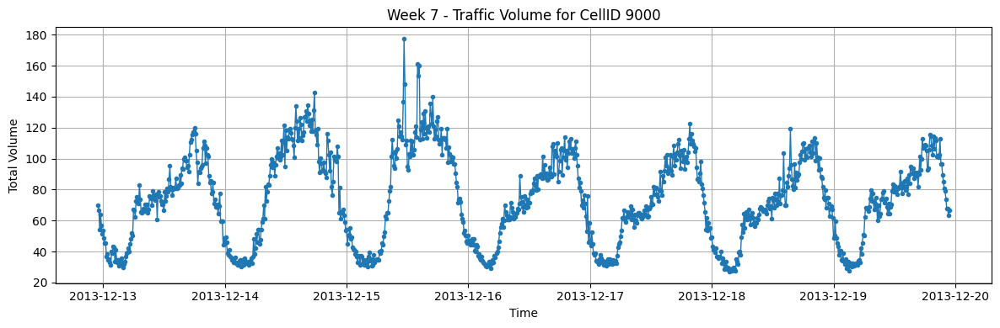

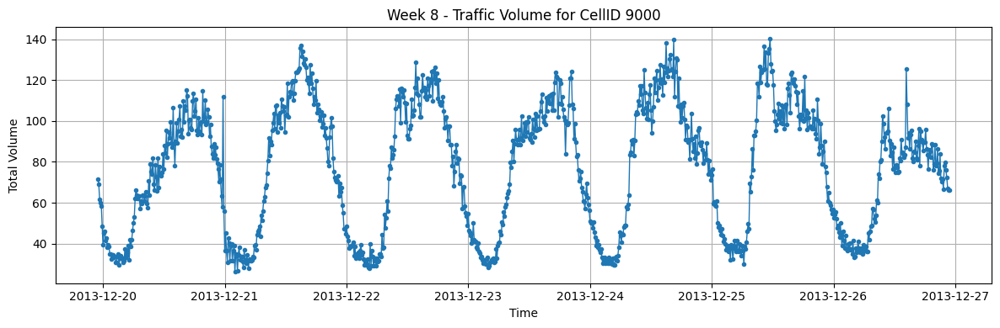

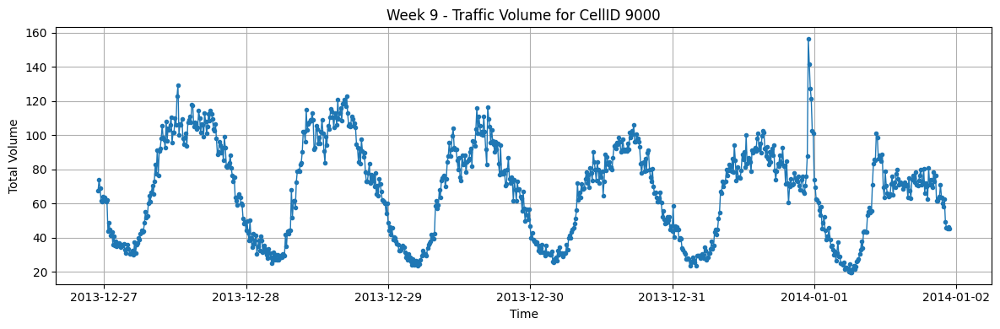

In [ ]:
plot_cell_traffic(weeks, 9000)

**decision :**
we decided to drop the last 3 weeks as they have different pattern of traffic (due to christmas)


### heatmap


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def create_heatmap(weeks, cell_range=(1, 10000)):
    # Step 1: Concatenate weeks 1 to 6 and compute average tot_vol per cell
    df_all = pd.concat(weeks[:6], ignore_index=True)
    avg_traffic = df_all.groupby('CellID')['tot_vol'].mean()

    # Step 2: Initialize a 100x100 matrix and fill with avg traffic
    heatmap_matrix = np.zeros((100, 100), dtype='float32')

    for cell_id in range(cell_range[0], cell_range[1] + 1):
        # Map cell_id (1 to 10000) to matrix index:
        row = 99 - (cell_id - 1) // 100  # invert to match visual: row 0 is top
        col = (cell_id - 1) % 100

        heatmap_matrix[row, col] = avg_traffic.get(cell_id, 0.0)  # fill 0 if missing

    # Step 3: Plot the heatmap
    plt.figure(figsize=(10, 10))
    plt.imshow(heatmap_matrix, cmap='hot', interpolation='nearest')
    plt.title('Average Traffic Volume per CellID (Weeks 1–6)')
    plt.colorbar(label='Average tot_vol')
    plt.xlabel('Cell Index (1–100)')
    plt.ylabel('Cell Index (1–100)')
    plt.tight_layout()
    plt.show()


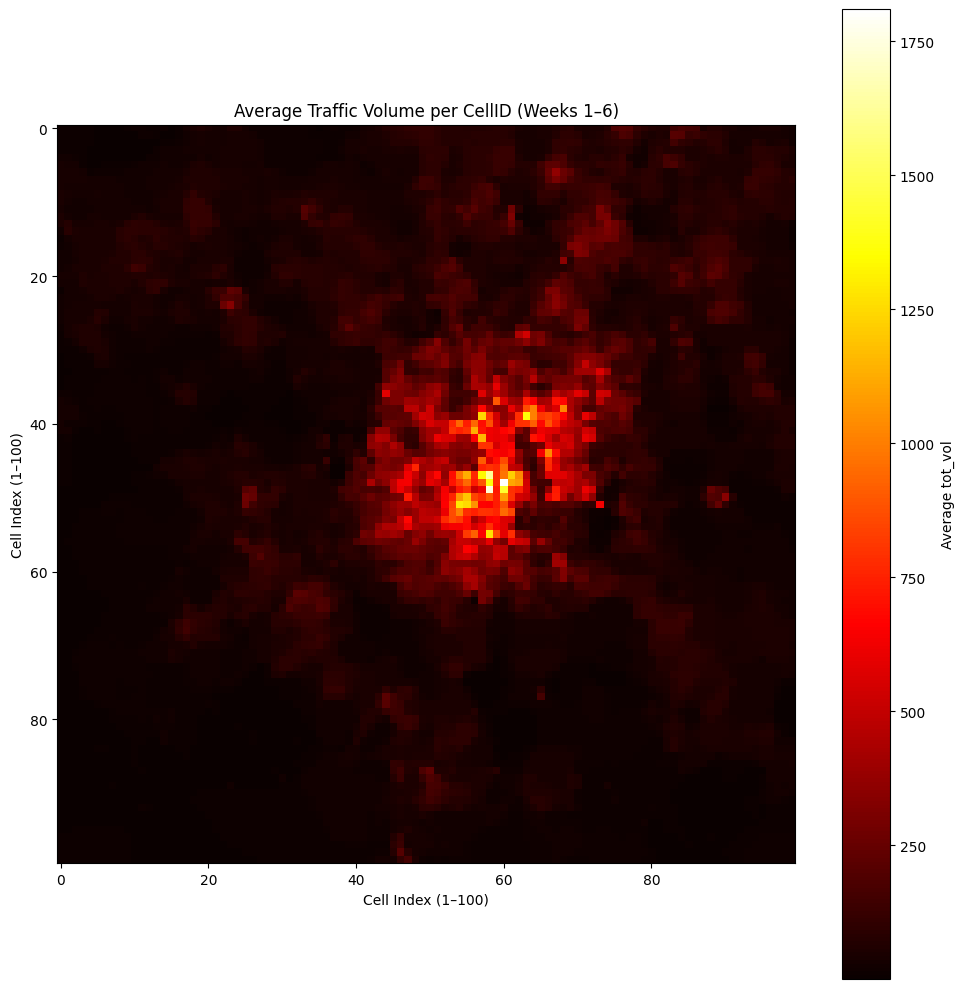

In [ ]:

create_heatmap(weeks[:6])


In [ ]:
def get_cellids_for_block(start_row, start_col, block_size=10):
    cell_ids = []
    for i in range(block_size):
        for j in range(block_size):
            row = start_row + i
            col = start_col + j
            cell_id = (99 - row) * 100 + col + 1
            cell_ids.append(cell_id)
    return cell_ids

target_cellids = get_cellids_for_block(45, 54)  # Adjusted to cover visible CellIDs


In [ ]:
df = df_all
subset_df = df[df['CellID'].isin(target_cellids)]


In [ ]:
subset_df = df[df['CellID'].isin(target_cellids)]


In [ ]:
subset_df["CellID"].unique()

array([4555, 4556, 4557, 4558, 4559, 4560, 4561, 4562, 4563, 4564, 4655,
       4656, 4657, 4658, 4659, 4660, 4661, 4662, 4663, 4664, 4755, 4756,
       4757, 4758, 4759, 4760, 4761, 4762, 4763, 4764, 4855, 4856, 4857,
       4858, 4859, 4860, 4861, 4862, 4863, 4864, 4955, 4956, 4957, 4958,
       4959, 4960, 4961, 4962, 4963, 4964, 5055, 5056, 5057, 5058, 5059,
       5060, 5061, 5062, 5063, 5064, 5155, 5156, 5157, 5158, 5159, 5160,
       5161, 5162, 5163, 5164, 5255, 5256, 5257, 5258, 5259, 5260, 5261,
       5262, 5263, 5264, 5355, 5356, 5357, 5358, 5359, 5360, 5361, 5362,
       5363, 5364, 5455, 5456, 5457, 5458, 5459, 5460, 5461, 5462, 5463,
       5464])

In [ ]:
def create_heatmap(df, cell_range=(1, 10000)):
    # Step 1: Concatenate weeks 1 to 6 and compute average tot_vol per cell
    df_all = df
    avg_traffic = df_all.groupby('CellID')['tot_vol'].mean()

    # Step 2: Initialize a 100x100 matrix and fill with avg traffic
    heatmap_matrix = np.zeros((100, 100), dtype='float32')

    for cell_id in range(cell_range[0], cell_range[1] + 1):
        # Map cell_id (1 to 10000) to matrix index:
        row = 99 - (cell_id - 1) // 100  # invert to match visual: row 0 is top
        col = (cell_id - 1) % 100

        heatmap_matrix[row, col] = avg_traffic.get(cell_id, 0.0)  # fill 0 if missing

    # Step 3: Plot the heatmap
    plt.figure(figsize=(10, 10))
    plt.imshow(heatmap_matrix, cmap='hot', interpolation='nearest')
    plt.title('Average Traffic Volume per CellID (Weeks 1–6)')
    plt.colorbar(label='Average tot_vol')
    plt.xlabel('Cell Index (1–100)')
    plt.ylabel('Cell Index (1–100)')
    plt.tight_layout()
    plt.show()

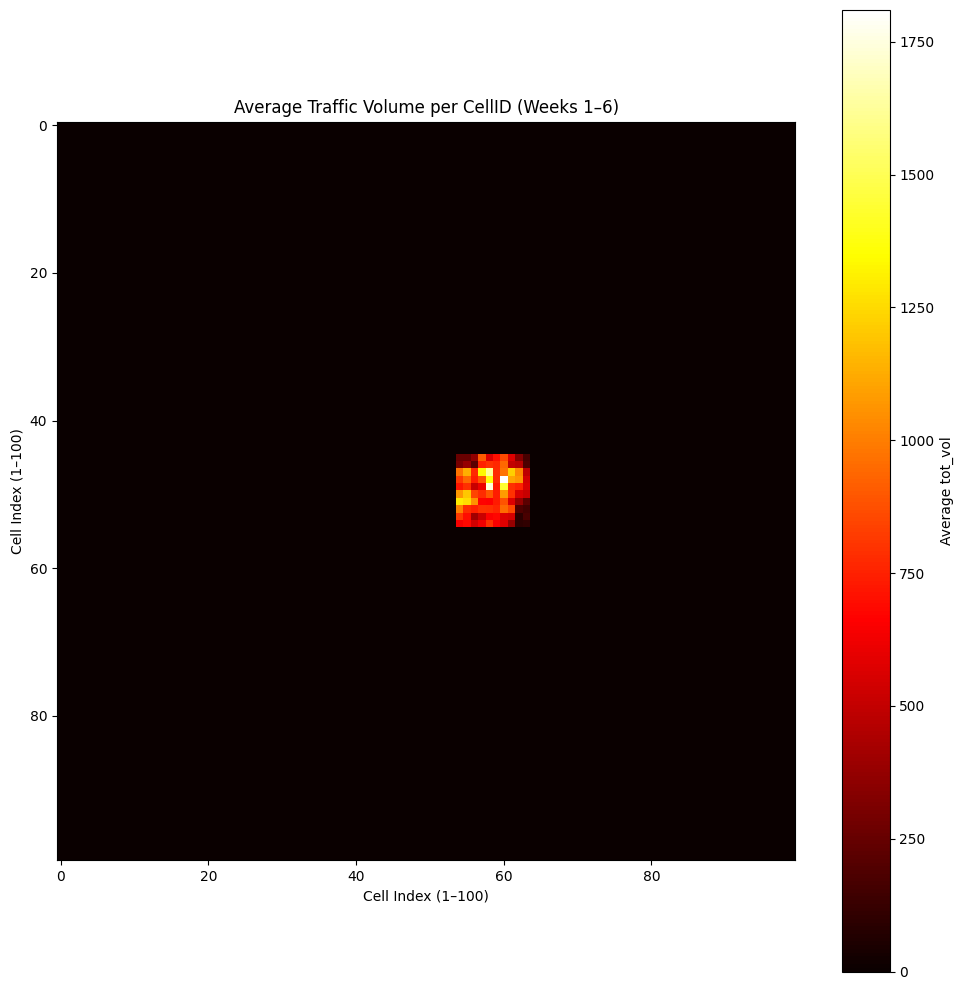

In [ ]:

create_heatmap(subset_df)

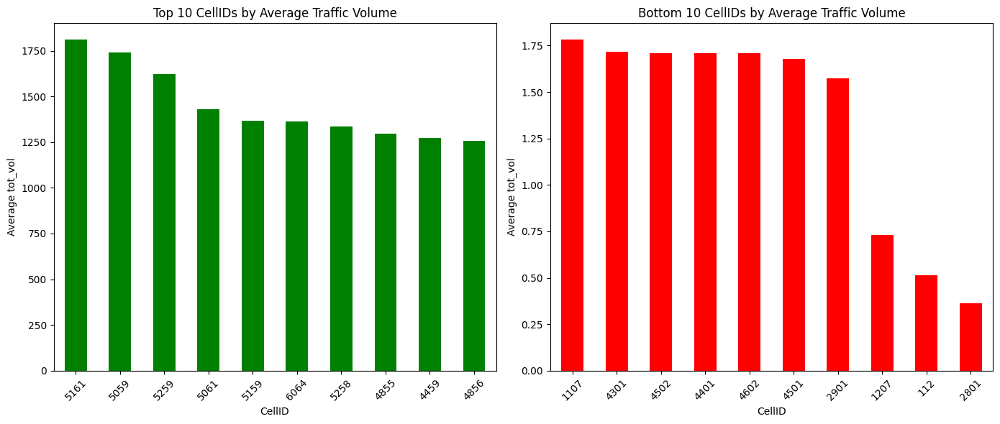

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Combine first 6 weeks of data

df_all = pd.concat(weeks[: 6], ignore_index=True)

# Group by CellID and compute average traffic volume
cell_avg = df_all.groupby('CellID')['tot_vol'].mean().sort_values(ascending=False)

# Get top 10 and bottom 10
top10 = cell_avg.head(10)
bottom10 = cell_avg.tail(10)

# Plotting
plt.figure(figsize=(14, 6))

# Top 10
plt.subplot(1, 2, 1)
top10.plot(kind='bar', color='green')
plt.title('Top 10 CellIDs by Average Traffic Volume')
plt.ylabel('Average tot_vol')
plt.xticks(rotation=45)

# Bottom 10
plt.subplot(1, 2, 2)
bottom10.plot(kind='bar', color='red')
plt.title('Bottom 10 CellIDs by Average Traffic Volume')
plt.ylabel('Average tot_vol')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


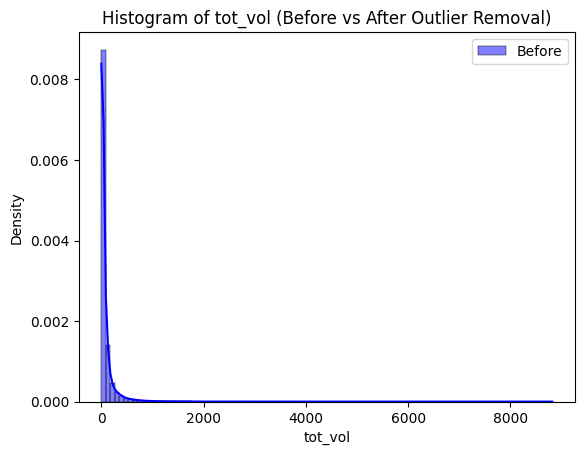

In [ ]:
sns.histplot(df_all['tot_vol'], bins=100, kde=True, color='blue', label='Before', stat='density')
# sns.histplot(df_clean['tot_vol'], bins=100, kde=True, color='green', label='After', stat='density', alpha=0.6)
plt.title('Histogram of tot_vol')
plt.xlabel('tot_vol')
plt.legend()

In [ ]:
plot_cell_traffic(weeks, 4456)

In [ ]:
import pandas as pd
import numpy as np

# Create time_slot to align across weeks
df['time_slot'] = df['time'].dt.strftime('%A-%H:%M')

# Apply IQR filtering per (CellID, time_slot)
def flag_outliers(group):
    Q1 = group['tot_vol'].quantile(0.25)
    Q3 = group['tot_vol'].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return group[(group['tot_vol'] >= lower) & (group['tot_vol'] <= upper)]

cleaned = (
    df
    .groupby(['CellID', 'time_slot'], group_keys=False)
    .apply(flag_outliers)
)

# Interpolate per week
cleaned_weeks = []

for week_num in sorted(df['week'].unique()):
    # Original week data
    week_original = df[df['week'] == week_num]

    # Filtered and cleaned data for the week
    week_df = cleaned[cleaned['week'] == week_num].drop(columns=['time_slot'])

    # Generate full time index and CellIDs
    cells = week_original['CellID'].unique()
    full_times = pd.date_range(
        start=week_original['time'].min(),
        end=week_original['time'].max(),
        freq='10min'
    )
    mux = pd.MultiIndex.from_product([cells, full_times], names=['CellID', 'time'])

    # Reindex to full grid
    week_df_full = week_df.set_index(['CellID', 'time']).reindex(mux)

    # Interpolate missing values per CellID
    week_df_interp = (
        week_df_full
        .groupby(level='CellID', group_keys=False)
        .apply(lambda g: g.interpolate(method='linear'))
        .reset_index()
    )

    # Fill any edge NaNs
    week_df_interp['tot_vol'] = week_df_interp['tot_vol'].ffill().bfill().astype('float32')

    # Add to list
    cleaned_weeks.append(week_df_interp)


In [ ]:
c_df_1 = cleaned_weeks[0]
c_df_2 = cleaned_weeks[1]
c_df_3 = cleaned_weeks[2]
c_df_4 = cleaned_weeks[3]

In [ ]:
cleaned_weeks[0]

,CellID,time,tot_vol,week_td,slot,week
0,4555,2013-10-31 23:00:00,1137.829956,3 days 23:00:00,1.0,1.0
1,4555,2013-10-31 23:10:00,1018.673889,3 days 23:10:00,2.0,1.0
2,4555,2013-10-31 23:20:00,1078.155762,3 days 23:20:00,3.0,1.0
3,4555,2013-10-31 23:30:00,993.763245,3 days 23:30:00,4.0,1.0
4,4555,2013-10-31 23:40:00,990.540405,3 days 23:40:00,5.0,1.0
...,...,...,...,...,...,...
100795,5464,2013-11-07 22:10:00,94.285881,3 days 22:10:00,1004.0,1.0
100796,5464,2013-11-07 22:20:00,101.321846,3 days 22:20:00,1005.0,1.0
100797,5464,2013-11-07 22:30:00,114.746002,3 days 22:30:00,1006.0,1.0
100798,5464,2013-11-07 22:40:00,94.028130,3 days 22:40:00,1007.0,1.0


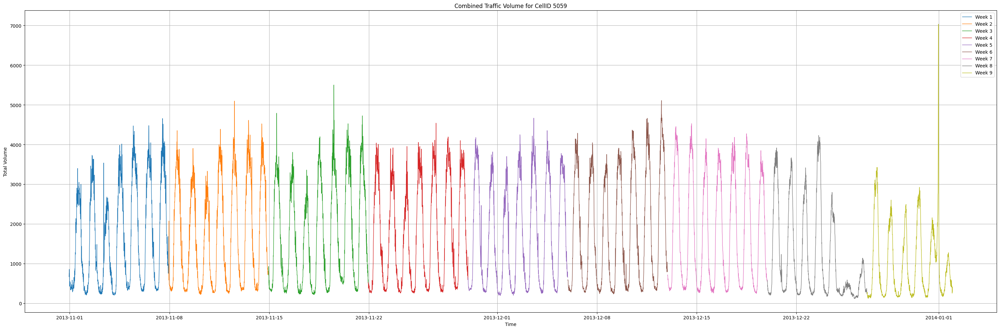

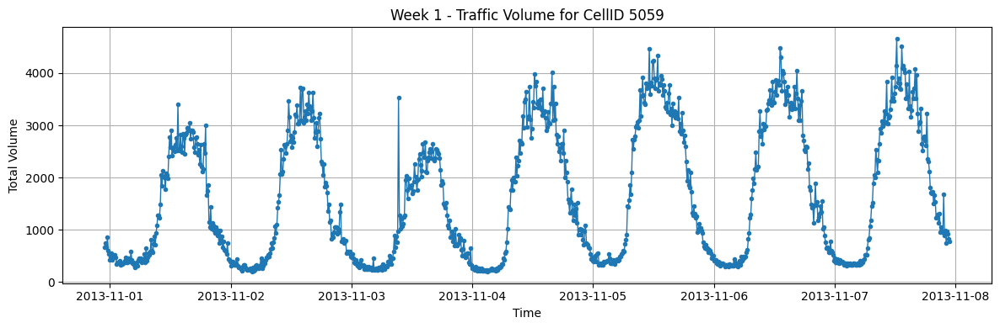

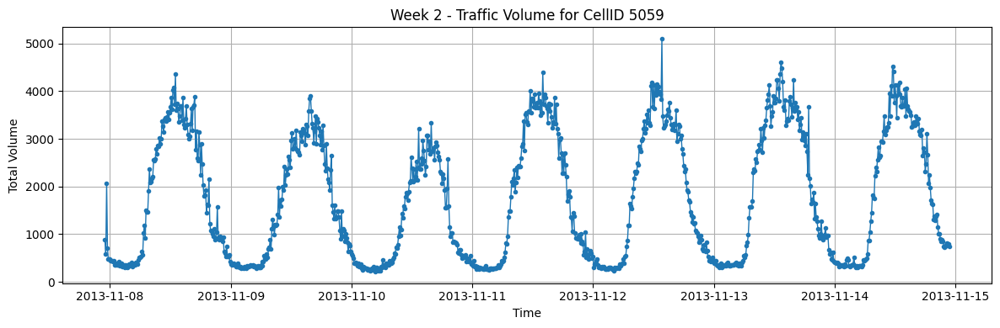

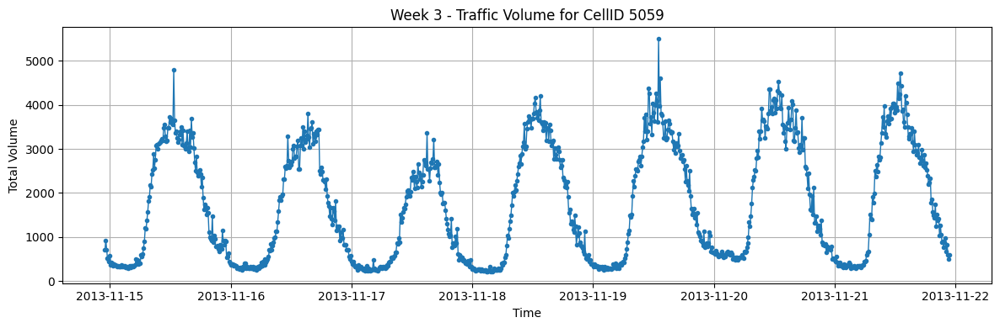

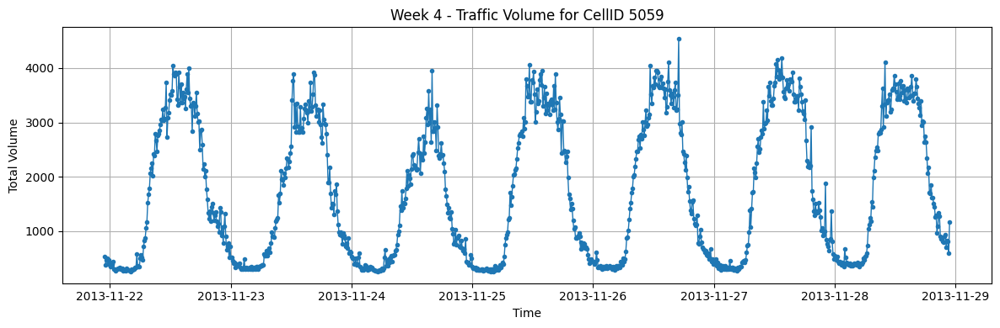

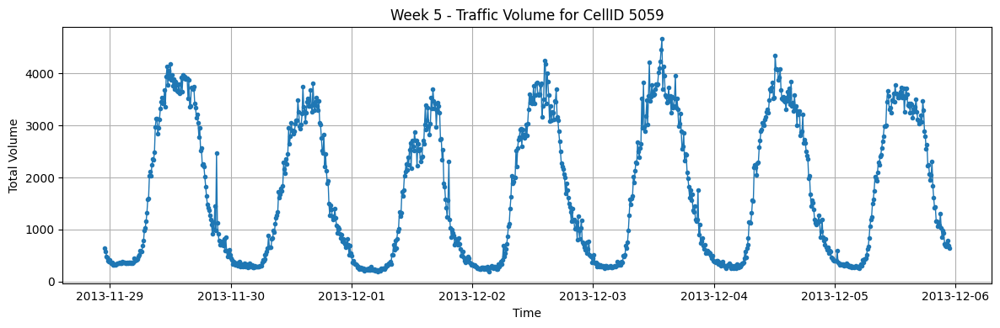

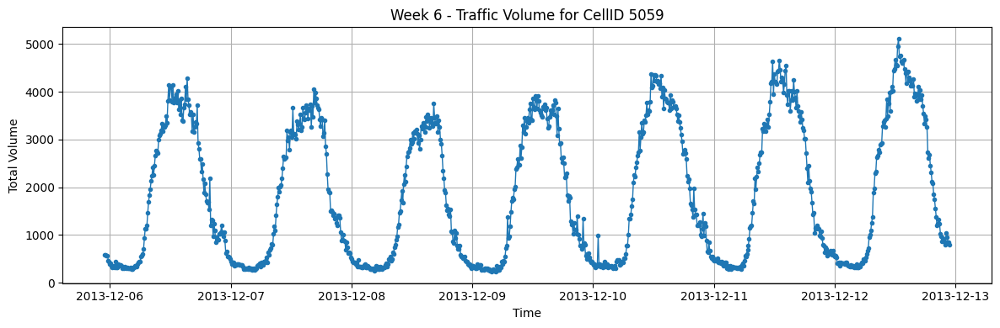

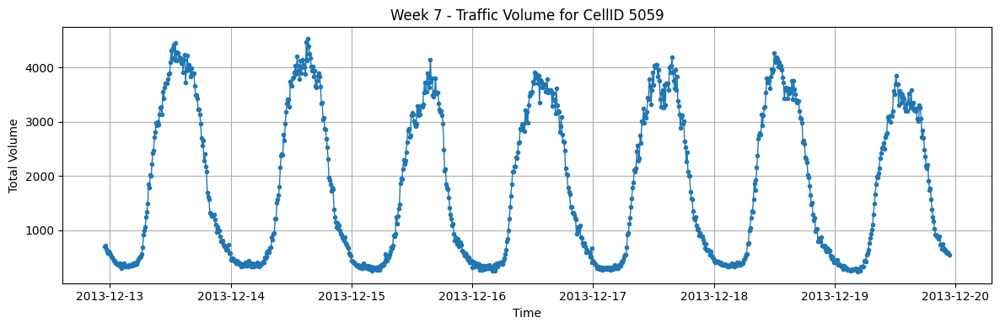

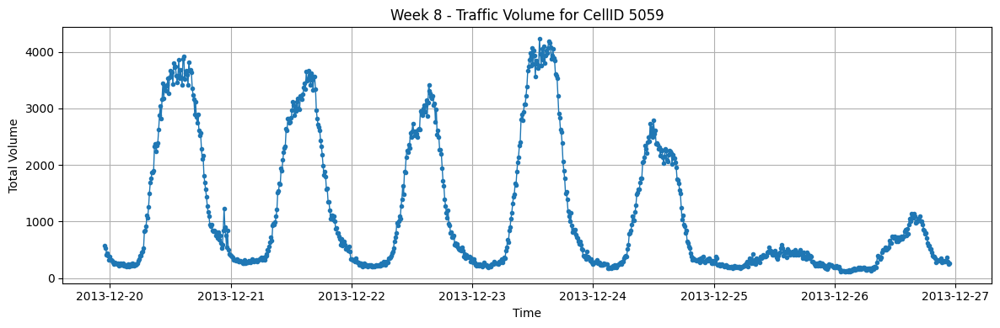

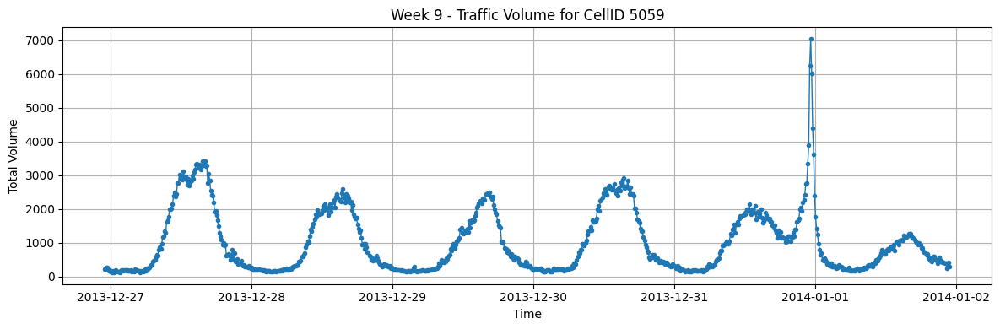

In [ ]:
plot_cell_traffic(weeks, 5059)

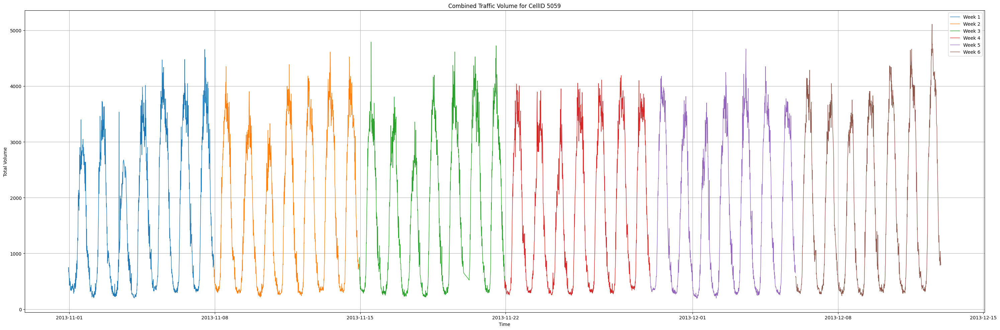

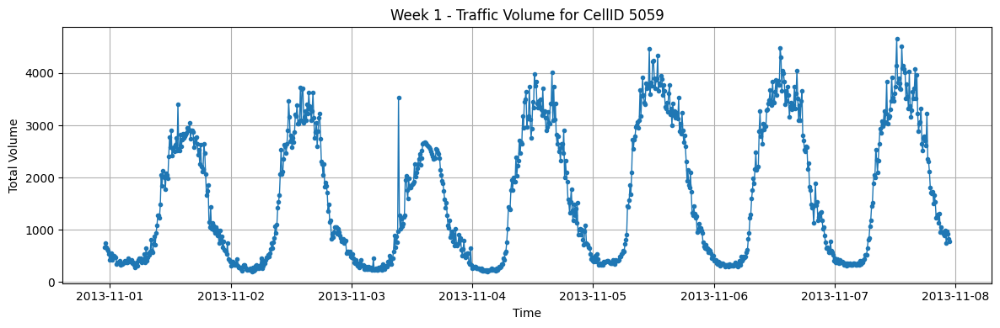

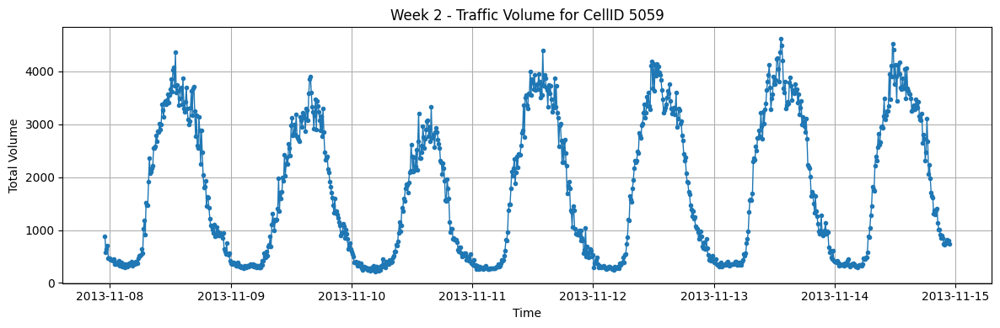

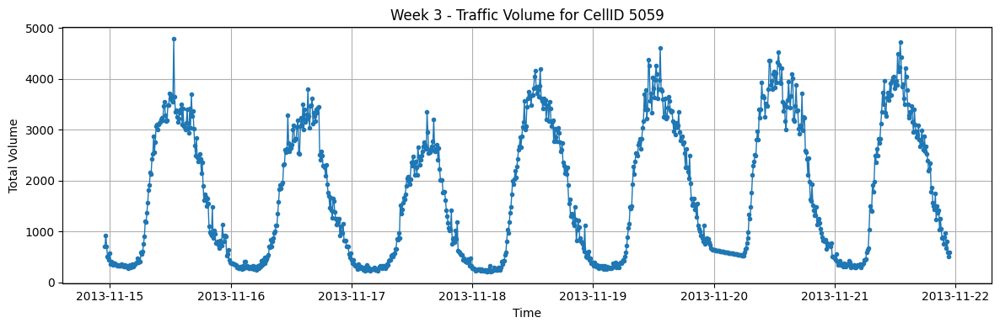

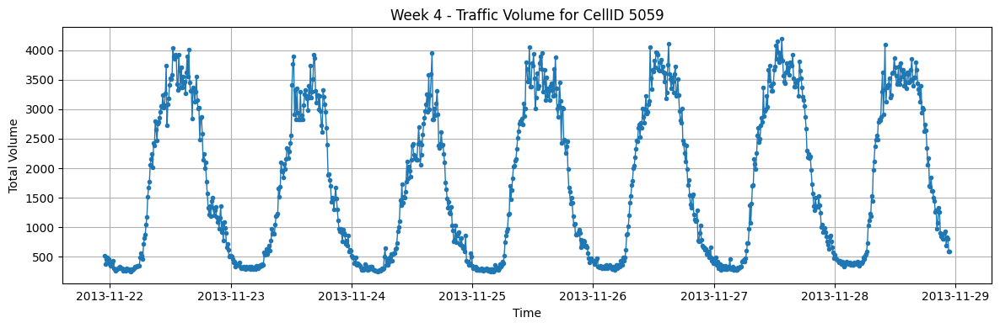

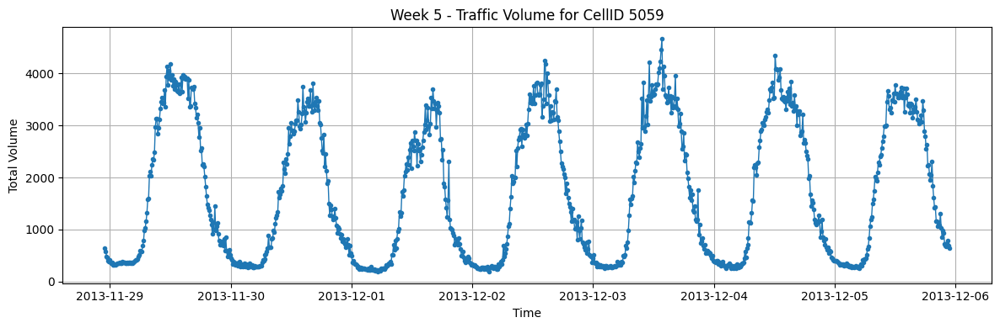

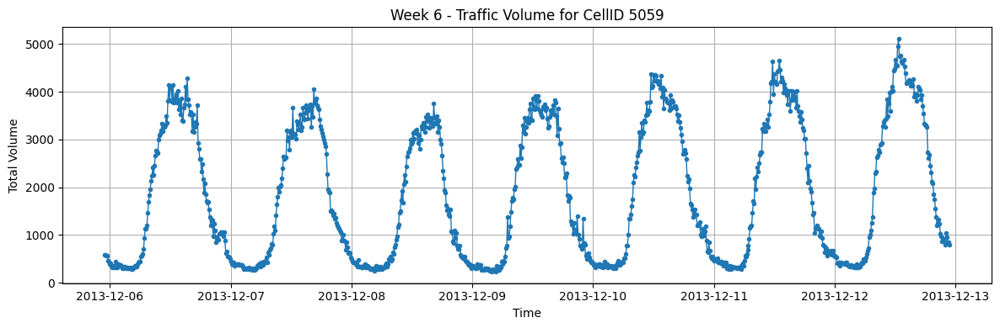

In [ ]:
plot_cell_traffic(cleaned_weeks, 5059)

In [ ]:
# Create 'week' column based on ISO calendar week (or simply index every 7 days from start)
df = subset_df.copy()
df['week'] = ((df['time'] - df['time'].min()) // pd.Timedelta(weeks=1)).astype(int) + 1


In [ ]:
df

,CellID,time,tot_vol,week_td,time_slot,slot,week
4590432,4555,2013-10-31 23:00:00,1137.829956,3 days 23:00:00,-23:00,1,1
4590433,4555,2013-10-31 23:10:00,1018.673889,3 days 23:10:00,-23:10,2,1
4590434,4555,2013-10-31 23:20:00,1078.155762,3 days 23:20:00,-23:20,3,1
4590435,4555,2013-10-31 23:30:00,993.763245,3 days 23:30:00,-23:30,4,1
4590436,4555,2013-10-31 23:40:00,990.540405,3 days 23:40:00,-23:40,5,1
...,...,...,...,...,...,...,...
55907707,5464,2013-12-12 22:10:00,105.984627,3 days 22:10:00,-22:10,1004,6
55907708,5464,2013-12-12 22:20:00,92.658394,3 days 22:20:00,-22:20,1005,6
55907709,5464,2013-12-12 22:30:00,92.743683,3 days 22:30:00,-22:30,1006,6
55907710,5464,2013-12-12 22:40:00,91.625702,3 days 22:40:00,-22:40,1007,6


In [ ]:
df_all

,CellID,time,tot_vol,week_td
0,1,2013-10-31 23:00:00,11.621593,3 days 23:00:00
1,1,2013-10-31 23:10:00,12.011781,3 days 23:10:00
2,1,2013-10-31 23:20:00,11.636580,3 days 23:20:00
3,1,2013-10-31 23:30:00,9.631550,3 days 23:30:00
4,1,2013-10-31 23:40:00,8.607673,3 days 23:40:00
...,...,...,...,...
60479995,10000,2013-12-12 22:10:00,21.965780,3 days 22:10:00
60479996,10000,2013-12-12 22:20:00,17.476660,3 days 22:20:00
60479997,10000,2013-12-12 22:30:00,15.648684,3 days 22:30:00
60479998,10000,2013-12-12 22:40:00,16.902803,3 days 22:40:00


In [ ]:
df = subset_df

In [ ]:


selected_cells = np.array([
    4555, 4556, 4557, 4558, 4559, 4560, 4561, 4562, 4563, 4564,
    4655, 4656, 4657, 4658, 4659, 4660, 4661, 4662, 4663, 4664,
    4755, 4756, 4757, 4758, 4759, 4760, 4761, 4762, 4763, 4764,
    4855, 4856, 4857, 4858, 4859, 4860, 4861, 4862, 4863, 4864,
    4955, 4956, 4957, 4958, 4959, 4960, 4961, 4962, 4963, 4964,
    5055, 5056, 5057, 5058, 5059, 5060, 5061, 5062, 5063, 5064,
    5155, 5156, 5157, 5158, 5159, 5160, 5161, 5162, 5163, 5164,
    5255, 5256, 5257, 5258, 5259, 5260, 5261, 5262, 5263, 5264,
    5355, 5356, 5357, 5358, 5359, 5360, 5361, 5362, 5363, 5364,
    5455, 5456, 5457, 5458, 5459, 5460, 5461, 5462, 5463, 5464
])

# Map CellID to (row, col) in 10x10 grid
cell_map = {}
for i, cid in enumerate(selected_cells):
    row = i // 10
    col = i % 10
    cell_map[cid] = (row, col)


In [ ]:
def convert_week_to_tensor(df, cell_map, time_col='time', value_col='tot_vol'):
    times = sorted(df[time_col].unique())
    T = len(times)
    H = W = 10  # for your selected 10x10 grid
    tensor = np.zeros((T, H, W), dtype=np.float32)

    time_idx = {t: i for i, t in enumerate(times)}

    for _, row in df.iterrows():
        cell_id = row['CellID']
        if cell_id not in cell_map:
            continue
        t = time_idx[row[time_col]]
        r, c = cell_map[cell_id]
        tensor[t, r, c] = row[value_col]

    return tensor


In [ ]:
df

,CellID,time,tot_vol,week_td,time_slot,slot,week
4590432,4555,2013-10-31 23:00:00,1137.829956,3 days 23:00:00,-23:00,1,1
4590433,4555,2013-10-31 23:10:00,1018.673889,3 days 23:10:00,-23:10,2,1
4590434,4555,2013-10-31 23:20:00,1078.155762,3 days 23:20:00,-23:20,3,1
4590435,4555,2013-10-31 23:30:00,993.763245,3 days 23:30:00,-23:30,4,1
4590436,4555,2013-10-31 23:40:00,990.540405,3 days 23:40:00,-23:40,5,1
...,...,...,...,...,...,...,...
55907707,5464,2013-12-12 22:10:00,105.984627,3 days 22:10:00,-22:10,1004,6
55907708,5464,2013-12-12 22:20:00,92.658394,3 days 22:20:00,-22:20,1005,6
55907709,5464,2013-12-12 22:30:00,92.743683,3 days 22:30:00,-22:30,1006,6
55907710,5464,2013-12-12 22:40:00,91.625702,3 days 22:40:00,-22:40,1007,6


In [ ]:
weekly_tensors = []

for week_id in sorted(df['week'].unique()):
    week_df = df[df['week'] == week_id]
    week_tensor = convert_week_to_tensor(week_df, cell_map)
    weekly_tensors.append(week_tensor)

# Check one shape
print(weekly_tensors[0].shape)  # Should be (T, 10, 10)


(1008, 10, 10)


In [ ]:
def create_samples_from_tensor(tensor, T_in=12, T_out=3, stride=1):
    """
    Generates (X, Y) pairs from a tensor of shape (T, H, W)
    Returns:
        X: (N, T_in, H, W)
        Y: (N, T_out, H, W)
    """
    T, H, W = tensor.shape
    X_list, Y_list = [], []
    for i in range(0, T - T_in - T_out + 1, stride):
        x = tensor[i:i+T_in]
        y = tensor[i+T_in:i+T_in+T_out]
        X_list.append(x)
        Y_list.append(y)
    return np.stack(X_list), np.stack(Y_list)


In [ ]:
T_in, T_out = 12, 3
X_all, Y_all = [], []

for tensor in weekly_tensors:
    X, Y = create_samples_from_tensor(tensor, T_in, T_out)
    X_all.append(X)
    Y_all.append(Y)

# Stack all weeks
X_all = np.vstack(X_all)  # (N_total, T_in, 10, 10)
Y_all = np.vstack(Y_all)  # (N_total, T_out, 10, 10)


In [ ]:
mean = X_all.mean()
std = X_all.std()

X_all = (X_all - mean) / std
Y_all = (Y_all - mean) / std  # Apply same scaling


In [ ]:


np.save('X_all.npy', X_all)
np.save('Y_all.npy', Y_all)


In [ ]:
X_all.shape  ,Y_all.shape  # (N, T_out, H, W)


((5964, 12, 10, 10), (5964, 3, 10, 10))

In [ ]:

X_all = np.load('X_all.npy')
Y_all = np.load('Y_all.npy')


In [ ]:
total_samples = X_all.shape[0]
train_end = int(total_samples * 0.6)
val_end   = int(total_samples * 0.8)

X_train, Y_train = X_all[:train_end], Y_all[:train_end]
X_val, Y_val     = X_all[train_end:val_end], Y_all[train_end:val_end]
X_test, Y_test   = X_all[val_end:], Y_all[val_end:]


In [ ]:
X_train.shape

(3578, 12, 10, 10)

In [ ]:
import tensorflow as tf

BATCH_SIZE = 64  # or tune it later based on GPU memory

train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train)) \
            .shuffle(10000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val)) \
            .batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test)) \
            .batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [ ]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 12, 10, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3, 10, 10), dtype=tf.float32, name=None))>

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_deepstn_plus_v2(T_in, H, W, T_out):
    inputs = tf.keras.Input(shape=(T_in, H, W))  # (B, T_in, H, W)
    x = layers.Reshape((T_in, H, W, 1))(inputs)  # Add channel dim → (B, T_in, H, W, 1)

    # --- First Stage ---
    conv3d_1 = layers.Conv3D(32, (3, 3, 3), padding='same', activation='relu')(x)
    conv3d_2 = layers.Conv3D(32, (3, 3, 3), padding='same', activation='relu')(conv3d_1)
    conv3d_3 = layers.Conv3D(32, (3, 3, 3), padding='same', activation='relu')(conv3d_2)

    convlstm_1 = layers.ConvLSTM2D(32, (3, 3), padding='same', return_sequences=True)(x)

    fusion_1 = layers.Add()([conv3d_3, convlstm_1])  # (B, T_in, H, W, 32)

    # --- Second Stage ---
    conv3d_4 = layers.Conv3D(64, (3, 3, 3), padding='same', activation='relu')(fusion_1)
    conv3d_5 = layers.Conv3D(64, (3, 3, 3), padding='same', activation='relu')(conv3d_4)
    conv3d_6 = layers.Conv3D(64, (3, 3, 3), padding='same', activation='relu')(conv3d_5)

    convlstm_2 = layers.ConvLSTM2D(64, (3, 3), padding='same', return_sequences=False)(fusion_1)  # (B, H, W, 64)

    fusion_2 = layers.Add()([conv3d_6[:, -1], convlstm_2])  # Align time dim before adding

    # --- Decoder ---
    x = layers.Flatten()(fusion_2)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(T_out * H * W, activation='linear')(x)
    outputs = layers.Reshape((T_out, H, W))(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs, name="DeepSTNPlus_v2")


In [ ]:
T_in = X_train.shape[1]
H = W = 10
T_out = Y_train.shape[1]

model = build_deepstn_plus_v2(T_in, H, W, T_out)
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
model.summary()


Model: "DeepSTNPlus_v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 12, 10,    │          0 │ -                 │
│ (InputLayer)        │ 10)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 12, 10,    │          0 │ input_layer_5[0]… │
│                     │ 10, 1)            │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d (Conv3D)     │ (None, 12, 10,    │        896 │ reshape_2[0][0]   │
│                     │ 10, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_1 (Conv3D)   │ (None, 12, 10,    │     27,680 │ conv3d[0][0]      │
│                     │ 10, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_2 (Conv3D)   │ (None, 12, 10,    │     27,680 │ conv3d_1[0][0]    │
│                     │ 10, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d         │ (None, 12, 10,    │     38,144 │ reshape_2[0][0]   │
│ (ConvLSTM2D)        │ 10, 32)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 12, 10,    │          0 │ conv3d_2[0][0],   │
│                     │ 10, 32)           │            │ conv_lstm2d[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_3 (Conv3D)   │ (None, 12, 10,    │     55,360 │ add[0][0]         │
│                     │ 10, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_4 (Conv3D)   │ (None, 12, 10,    │    110,656 │ conv3d_3[0][0]    │
│                     │ 10, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv3d_5 (Conv3D)   │ (None, 12, 10,    │    110,656 │ conv3d_4[0][0]    │
│                     │ 10, 64)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 10, 10,    │          0 │ conv3d_5[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d_1       │ (None, 10, 10,    │    221,440 │ add[0][0]         │
│ (ConvLSTM2D)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 10, 10,    │          0 │ get_item[0][0],   │
│                     │ 64)               │            │ conv_lstm2d_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 6400)      │          0 │ add_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │  3,277,312 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 300)       │    153,900 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_3 (Reshape) │ (None, 3, 10, 10) │          0 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,023,724 (15.35 MB)

 Trainable params: 4,023,724 (15.35 MB)

 Non-trainable params: 0 (0.00 B)

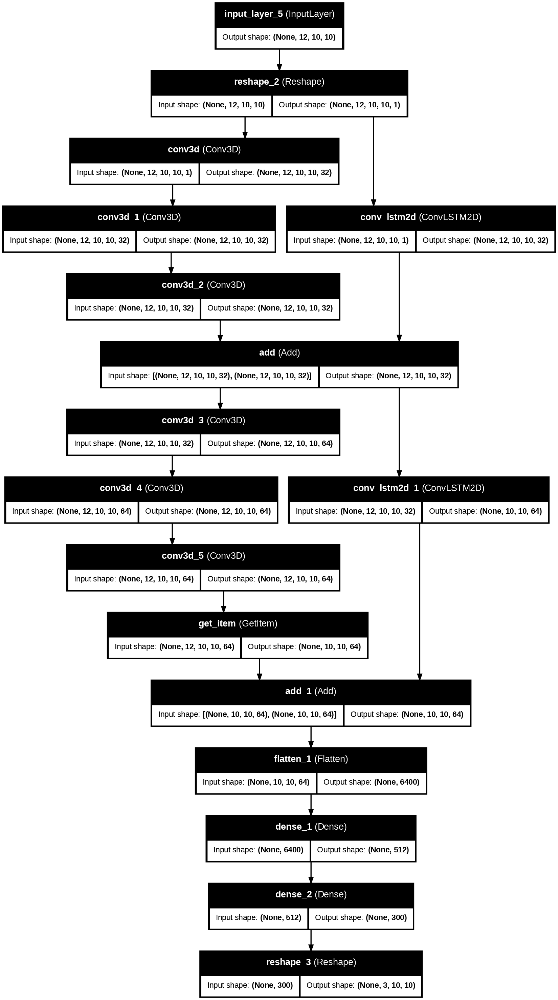

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model,
           to_file='deepstn_plus.png',
           show_shapes=True,
           show_layer_names=True,
           expand_nested=True,
           dpi=120)


In [ ]:
model.summary(expand_nested=True, line_length=120)


Model: "DeepSTNPlus_v2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━
┃ Layer (type)                      ┃ Output Shape                 ┃           Param # ┃ Connected to              
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━
│ input_layer_5 (InputLayer)        │ (None, 12, 10, 10)           │                 0 │ -                         
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ reshape_2 (Reshape)               │ (None, 12, 10, 10, 1)        │                 0 │ input_layer_5[0][0]       
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d (Conv3D)                   │ (None, 12, 10, 10, 32)       │               896 │ reshape_2[0][0]           
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d_1 (Conv3D)                 │ (None, 12, 10, 10, 32)       │            27,680 │ conv3d[0][0]              
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d_2 (Conv3D)                 │ (None, 12, 10, 10, 32)       │            27,680 │ conv3d_1[0][0]            
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv_lstm2d (ConvLSTM2D)          │ (None, 12, 10, 10, 32)       │            38,144 │ reshape_2[0][0]           
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ add (Add)                         │ (None, 12, 10, 10, 32)       │                 0 │ conv3d_2[0][0],           
│                                   │                              │                   │ conv_lstm2d[0][0]         
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d_3 (Conv3D)                 │ (None, 12, 10, 10, 64)       │            55,360 │ add[0][0]                 
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d_4 (Conv3D)                 │ (None, 12, 10, 10, 64)       │           110,656 │ conv3d_3[0][0]            
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv3d_5 (Conv3D)                 │ (None, 12, 10, 10, 64)       │           110,656 │ conv3d_4[0][0]            
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ get_item (GetItem)                │ (None, 10, 10, 64)           │                 0 │ conv3d_5[0][0]            
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ conv_lstm2d_1 (ConvLSTM2D)        │ (None, 10, 10, 64)           │           221,440 │ add[0][0]                 
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ add_1 (Add)                       │ (None, 10, 10, 64)           │                 0 │ get_item[0][0],           
│                                   │                              │                   │ conv_lstm2d_1[0][0]       
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ flatten_1 (Flatten)               │ (None, 6400)                 │                 0 │ add_1[0][0]               
├───────────────────────────────────┼──────────────────────────────┼───────────────────┼───────────────────────────
│ dense_1 (Dense)                   │ (None, 512)                  │         3,277,312 │ flatten_1[0][0]           
├───────────────────────────────────┼───────────────────

 Total params: 12,071,174 (46.05 MB)

 Trainable params: 4,023,724 (15.35 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,047,450 (30.70 MB)

In [ ]:
model.save("deepstn_plus.h5")


In [ ]:
import numpy as np
import tensorflow as tf

def ouroboros_training(model, original_X, original_Y, batch_size=64):
    """
    Applies the Ouroboros Training Scheme (OTS) to fine-tune a trained model
    by recursively feeding its own predictions and retraining on them.

    Parameters:
        model       : Trained Keras model (e.g., DeepSTN+)
        original_X  : np.array of shape (N, T_in, H, W), original inputs
        original_Y  : np.array of shape (N, T_out, H, W), ground truth outputs
        batch_size  : Batch size for retraining

    Returns:
        fine_tuned_model: The same model, fine-tuned with OTS
    """
    T_in = original_X.shape[1]
    T_out = original_Y.shape[1]
    N, H, W = original_X.shape[0], original_X.shape[2], original_X.shape[3]

    # Clone and recompile the model
    fine_tuned_model = tf.keras.models.clone_model(model)
    fine_tuned_model.set_weights(model.get_weights())
    fine_tuned_model.compile(optimizer='adam', loss='mse', metrics=['mae'])

    X_aug, Y_aug = [], []

    for i in range(N):
        q = list(original_X[i])  # Initial T_in frames
        generated = []

        for _ in range(T_out):
            x_input = np.expand_dims(np.array(q[-T_in:]), axis=0)  # (1, T_in, H, W)
            y_pred = fine_tuned_model.predict(x_input, verbose=0)[0][0]  # (H, W)
            generated.append(y_pred)
            q.append(y_pred)

        X_aug.append(np.array(q[:T_in]))
        Y_aug.append(np.array(generated))

    X_aug = np.array(X_aug)
    Y_aug = np.array(Y_aug)

    # Retrain the model using its own predictions
    fine_tuned_model.fit(X_aug, Y_aug, batch_size=batch_size, epochs=1, verbose=1)

    return fine_tuned_model


In [ ]:
def ouroboros_training_scheme(model, data, S, E=1, batch_size=64):
    """
    Implements the Ouroboros Training Scheme (OTS) as described in Algorithm 1 of the paper.

    Parameters:
        model       : A pre-trained Keras model (DeepSTN+)
        data        : List or array of time series frames (N, H, W)
        S           : Sequence length (e.g., T_in)
        E           : Number of training epochs (default 1 as in paper)
        batch_size  : Batch size for SGD training

    Returns:
        model       : Fine-tuned model after applying OTS
    """
    data = np.array(data)
    T, H, W = data.shape

    for e in range(E):
        X_ots, Y_ots = [], []

        for t in range(1, T - S):
            if t == 1:
                # Step 6: Initialize Q with first S frames
                Q = [data[i] for i in range(S)]
            else:
                # Step 8-10: Pop, Predict, Push
                Q.pop(0)
                x_input = np.expand_dims(np.array(Q), axis=0)  # shape (1, S, H, W)
                pred = model.predict(x_input, verbose=0)[0][0]  # predict one frame
                Q.append(pred)

            # Step 11: Get ground truth frame as target
            target = data[S + t]

            # Step 12: Train on (Q, target)
            X_ots.append(np.array(Q))
            Y_ots.append(target)

        # Batch training for all steps at once
        X_ots = np.array(X_ots)
        Y_ots = np.array(Y_ots)
        model.fit(X_ots, Y_ots, batch_size=batch_size, epochs=1, verbose=1)

    return model


In [ ]:
# Train your model normally first
model.fit(train_ds, validation_data=val_ds, epochs=20)

# Apply OTS for one fine-tuning pass
fine_tuned_model = ouroboros_training(model, X_train, Y_train)


Epoch 1/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0196 - mae: 0.0897 - val_loss: 0.0324 - val_mae: 0.1089
Epoch 2/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0195 - mae: 0.0889 - val_loss: 0.0349 - val_mae: 0.1163
Epoch 3/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0203 - mae: 0.0921 - val_loss: 0.0324 - val_mae: 0.1116
Epoch 4/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0188 - mae: 0.0883 - val_loss: 0.0320 - val_mae: 0.1120
Epoch 5/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0178 - mae: 0.0852 - val_loss: 0.0320 - val_mae: 0.1105
Epoch 6/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0175 - mae: 0.0841 - val_loss: 0.0331 - val_mae: 0.1127
Epoch 7/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0171 - mae: 0.0824 - val_loss: 0.0329 - val_mae: 0.1124
Epoch 8/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0174 - mae: 0.0847 - val_loss: 0.0339 - val_mae: 0.1124
Epoch 9/20
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.016

In [ ]:
def predict_next_traffic(model, X_input):
    """
    Predicts the next T_out traffic maps using the trained model.

    Parameters:
        model     : Trained DeepSTN+ model
        X_input   : np.array of shape (T_in, H, W)

    Returns:
        Y_pred    : np.array of shape (T_out, H, W)
    """
    X_input = np.expand_dims(X_input, axis=0)  # Add batch dim: (1, T_in, H, W)
    Y_pred = model.predict(X_input, verbose=0)[0]  # Remove batch dim: (T_out, H, W)
    return Y_pred


In [ ]:
def recursive_forecast(model, X_seed, steps, T_in):
    """
    Generate long-term forecast using recursive inference.

    Parameters:
        model  : Trained DeepSTN+ model
        X_seed : np.array of shape (T_in, H, W), initial traffic sequence
        steps  : Total number of future steps to predict
        T_in   : Number of input frames (same as model's input length)

    Returns:
        forecast: np.array of shape (steps, H, W)
    """
    forecast = []
    Q = list(X_seed)

    for _ in range(steps):
        x_input = np.expand_dims(np.array(Q[-T_in:]), axis=0)
        y_pred = model.predict(x_input, verbose=0)[0][0]  # Only predict first frame
        forecast.append(y_pred)
        Q.append(y_pred)

    return np.array(forecast)


In [ ]:
# Select one example from your test dataset
X_input, _ = next(iter(test_ds))  # Get a batch
X_input = X_input[0].numpy()      # Select first sample in batch (T_in, 10, 10)


In [ ]:
# X_input is your latest traffic slice of shape (12, 10, 10)
next_3_steps = predict_next_traffic(fine_tuned_model, X_input)

# Predict 24 steps ahead recursively (e.g. 4 hours at 10min intervals)
forecast_24 = recursive_forecast(fine_tuned_model, X_input, steps=48, T_in=12)


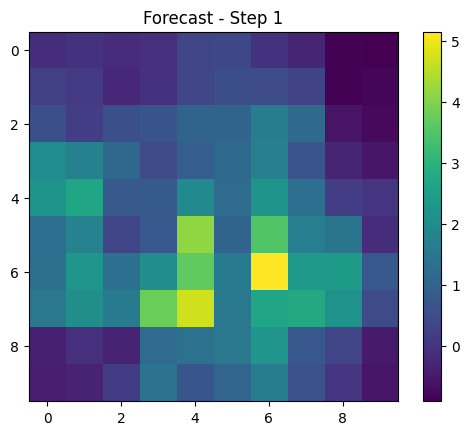

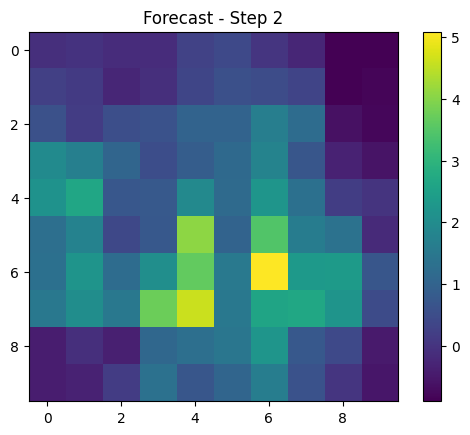

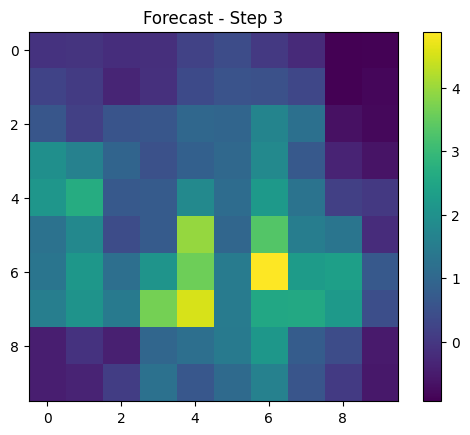

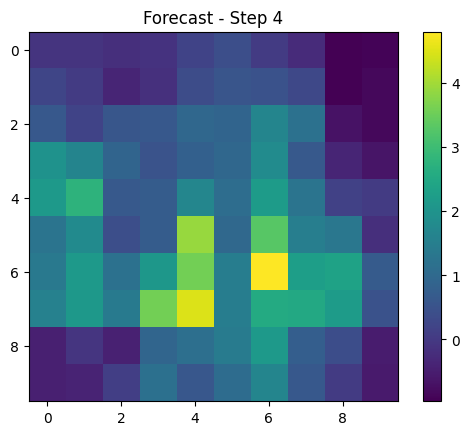

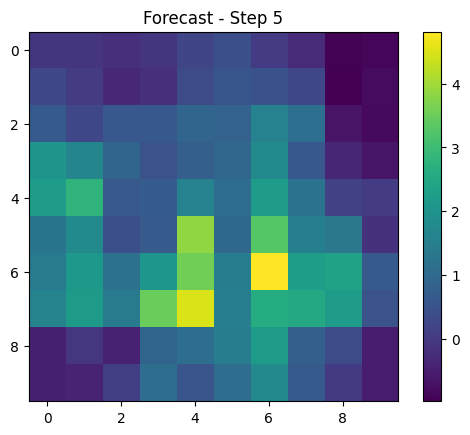

...

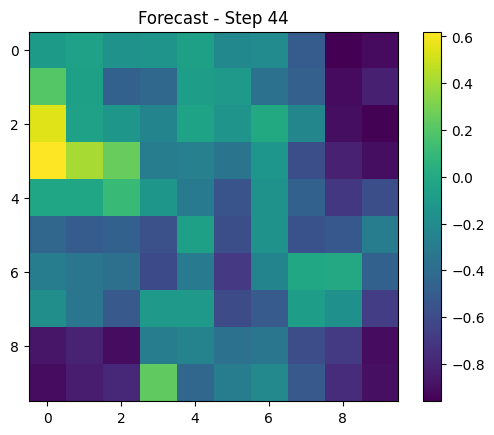

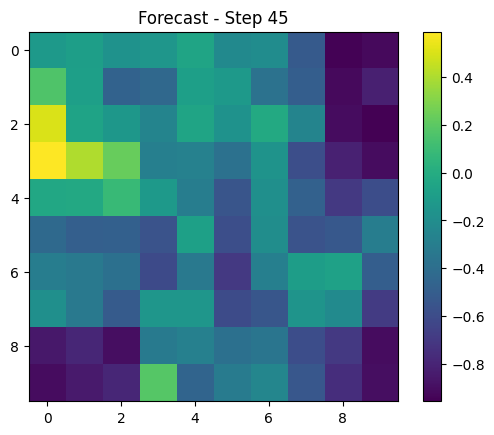

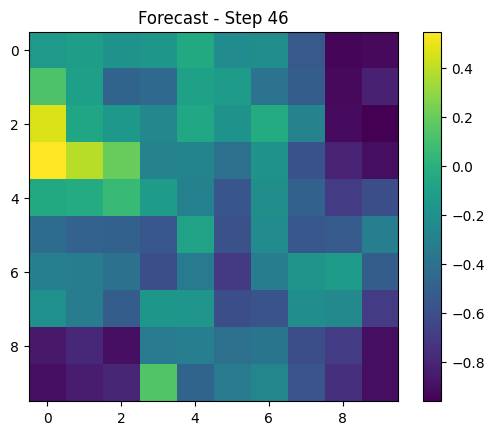

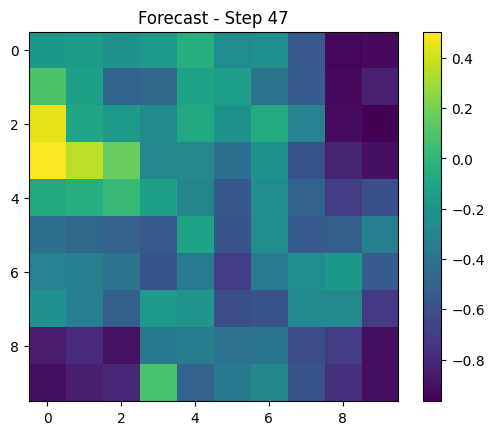

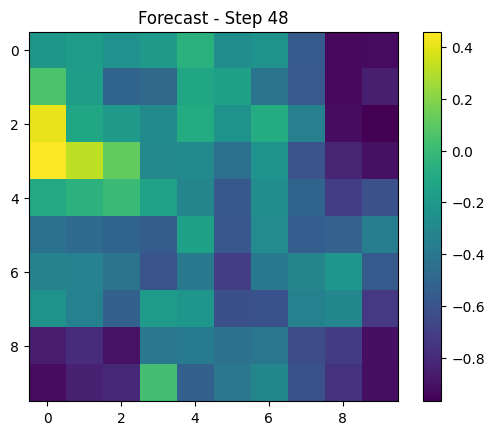

In [ ]:
import matplotlib.pyplot as plt

for t, frame in enumerate(forecast_24):
    plt.imshow(frame, cmap='viridis')
    plt.title(f"Forecast - Step {t+1}")
    plt.colorbar()
    plt.show()


In [ ]:
def plot_prediction_vs_groundtruth(y_true, y_pred, timestamps=None):
    """
    Visualize predicted vs ground truth traffic with mean ± std shading.
    Handles both NumPy arrays and TensorFlow tensors.

    Parameters:
        y_true     : shape (N, H, W)
        y_pred     : shape (N, H, W)
        timestamps : optional list of x-axis labels
    """
    if hasattr(y_true, 'numpy'):
        y_true = y_true.numpy()
    if hasattr(y_pred, 'numpy'):
        y_pred = y_pred.numpy()

    y_true_flat = y_true.reshape(y_true.shape[0], -1).mean(axis=1)
    y_pred_flat = y_pred.reshape(y_pred.shape[0], -1).mean(axis=1)
    std = y_true.reshape(y_true.shape[0], -1).std(axis=1)

    x = np.arange(len(y_true_flat)) if timestamps is None else timestamps

    plt.figure(figsize=(12, 4))
    plt.plot(x, y_true_flat, label='Ground Truth Mean', color='green')
    plt.plot(x, y_pred_flat, label='Predicted Mean', color='red', linestyle='--')
    plt.fill_between(x, y_true_flat - std, y_true_flat + std, alpha=0.2, color='blue', label='GT ± std')

    plt.title("Predicted vs Ground Truth Traffic")
    plt.xlabel("Time")
    plt.ylabel("Traffic Volume")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


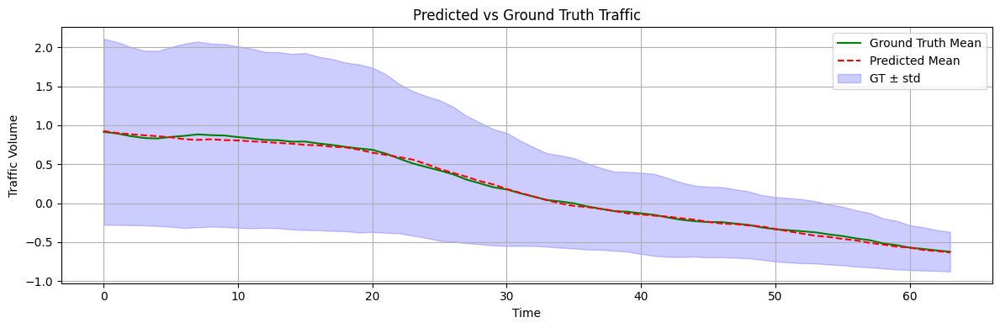

In [ ]:
# Suppose you have:
# Y_true : shape (24, 10, 10)
# Y_pred : shape (24, 10, 10)

plot_prediction_vs_groundtruth(Y_true, Y_pred)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ModelCheckpoint("best_deepstn_model.h5", save_best_only=True)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks
)


Epoch 1/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0368 - mae: 0.1243

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0367 - mae: 0.1242 - val_loss: 0.0402 - val_mae: 0.1228
Epoch 2/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0301 - mae: 0.1115

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0301 - mae: 0.1115 - val_loss: 0.0374 - val_mae: 0.1189
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0284 - mae: 0.1085 - val_loss: 0.0418 - val_mae: 0.1241
Epoch 4/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0289 - mae: 0.1089

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0288 - mae: 0.1089 - val_loss: 0.0353 - val_mae: 0.1174
Epoch 5/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0254 - mae: 0.1030

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0254 - mae: 0.1029 - val_loss: 0.0339 - val_mae: 0.1134
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0245 - mae: 0.1002 - val_loss: 0.0349 - val_mae: 0.1135
Epoch 7/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0233 - mae: 0.0978

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0233 - mae: 0.0978 - val_loss: 0.0337 - val_mae: 0.1112
Epoch 8/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0233 - mae: 0.0975

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0233 - mae: 0.0974 - val_loss: 0.0323 - val_mae: 0.1106
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0225 - mae: 0.0953 - val_loss: 0.0327 - val_mae: 0.1128
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0224 - mae: 0.0957 - val_loss: 0.0333 - val_mae: 0.1152
Epoch 11/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0220 - mae: 0.0953

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0220 - mae: 0.0952 - val_loss: 0.0317 - val_mae: 0.1115
Epoch 12/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0216 - mae: 0.0930

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0216 - mae: 0.0930 - val_loss: 0.0316 - val_mae: 0.1110
Epoch 13/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0211 - mae: 0.0927

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0211 - mae: 0.0927 - val_loss: 0.0315 - val_mae: 0.1096
Epoch 14/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0205 - mae: 0.0910 - val_loss: 0.0321 - val_mae: 0.1099
Epoch 15/50
54/56 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0202 - mae: 0.0901

56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0202 - mae: 0.0901 - val_loss: 0.0312 - val_mae: 0.1084
Epoch 16/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0198 - mae: 0.0894 - val_loss: 0.0317 - val_mae: 0.1091
Epoch 17/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0196 - mae: 0.0893 - val_loss: 0.0318 - val_mae: 0.1109
Epoch 18/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0192 - mae: 0.0882 - val_loss: 0.0323 - val_mae: 0.1100
Epoch 19/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0190 - mae: 0.0879 - val_loss: 0.0323 - val_mae: 0.1093
Epoch 20/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0186 - mae: 0.0860 - val_loss: 0.0325 - val_mae: 0.1126


In [ ]:
test_loss, test_mae = model.evaluate(test_ds)
print(f"Test MSE: {test_loss:.4f} | Test MAE: {test_mae:.4f}")


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0581 - mae: 0.1469
Test MSE: 0.0677 | Test MAE: 0.1602


2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step


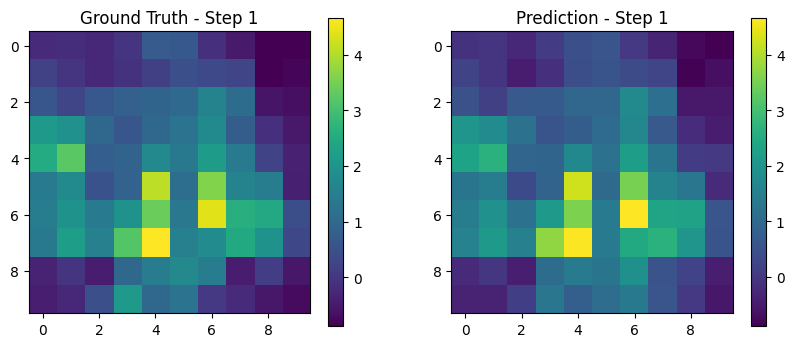

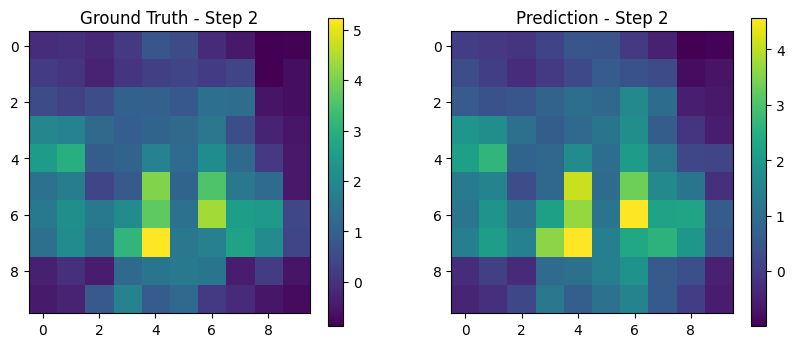

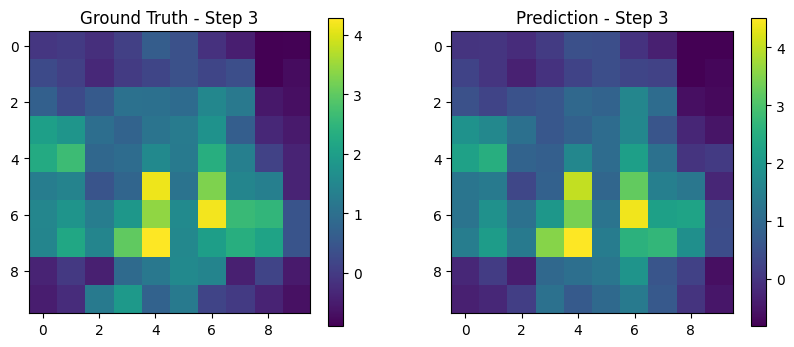

In [ ]:
import matplotlib.pyplot as plt

X_sample, Y_true = next(iter(test_ds))
Y_pred = model.predict(X_sample)

# Example: visualize the first prediction
for t in range(Y_pred.shape[1]):  # T_out
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(Y_true[0, t], cmap='viridis')
    plt.title(f"Ground Truth - Step {t+1}")
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.imshow(Y_pred[0, t], cmap='viridis')
    plt.title(f"Prediction - Step {t+1}")
    plt.colorbar()
    plt.show()


In [ ]:
import numpy as np

def compute_nrmse(y_true, y_pred):
    """
    y_true and y_pred must be numpy arrays of shape (samples, T_out, H, W)
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Flatten predictions and ground truth
    d_true = y_true.flatten()
    d_pred = y_pred.flatten()

    N = d_true.shape[0]
    d_mean = np.mean(d_true)

    rmse = np.sqrt(np.sum((d_pred - d_true) ** 2) / N)
    nrmse = rmse / d_mean

    return nrmse


In [ ]:
# Get test batch (or full test set if small)
X_batch, Y_true = next(iter(test_ds))
Y_pred = model.predict(X_batch)

nrmse_score = compute_nrmse(Y_true, Y_pred)
print(f"📊 NRMSE on Test Batch: {nrmse_score:.4f}")


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
📊 NRMSE on Test Batch: 1.1645


In [ ]:
all_y_true, all_y_pred = [], []

for X_batch, Y_batch in test_ds:
    preds = model.predict(X_batch)
    all_y_true.append(Y_batch.numpy())
    all_y_pred.append(preds)

# Concatenate across all batches
all_y_true = np.concatenate(all_y_true, axis=0)
all_y_pred = np.concatenate(all_y_pred, axis=0)

print("📊 Full Test Set NRMSE:", compute_nrmse(all_y_true, all_y_pred))


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
📊 Full Test Set NRMSE: -92.84482


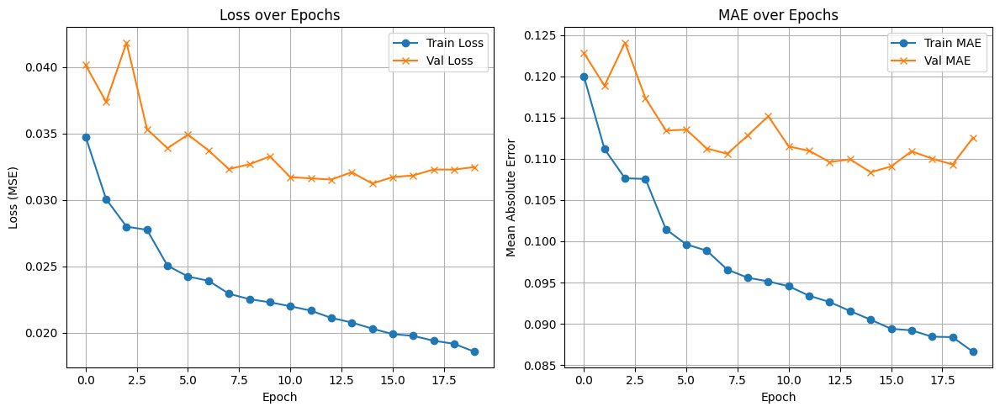

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Plot loss
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='x')
    plt.title("Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss (MSE)")
    plt.legend()
    plt.grid(True)

    # Plot MAE
    plt.subplot(1, 2, 2)
    plt.plot(history.history['mae'], label='Train MAE', marker='o')
    plt.plot(history.history['val_mae'], label='Val MAE', marker='x')
    plt.title("MAE over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Mean Absolute Error")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Call the function
plot_training_history(history)


In [ ]:
from tensorflow.keras.callbacks import Callback

class NRMSELogger(Callback):
    def __init__(self, val_data):
        super().__init__()
        self.val_data = val_data
        self.nrmse_history = []

    def on_epoch_end(self, epoch, logs=None):
        y_true_all, y_pred_all = [], []
        for x_batch, y_batch in self.val_data:
            y_pred = self.model.predict(x_batch, verbose=0)
            y_true_all.append(y_batch.numpy())
            y_pred_all.append(y_pred)

        y_true_all = np.concatenate(y_true_all, axis=0)
        y_pred_all = np.concatenate(y_pred_all, axis=0)

        nrmse = compute_nrmse(y_true_all, y_pred_all)
        self.nrmse_history.append(nrmse)
        print(f"🔍 Epoch {epoch + 1}: NRMSE = {nrmse:.4f}")


In [ ]:
nrmse_logger = NRMSELogger(val_ds)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True),
               ModelCheckpoint("best_model.h5", save_best_only=True),
               nrmse_logger]
)


Epoch 1/50
54/56 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0217 - mae: 0.0936

🔍 Epoch 1: NRMSE = 3.8050
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0217 - mae: 0.0936 - val_loss: 0.0317 - val_mae: 0.1095
Epoch 2/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0198 - mae: 0.0893

🔍 Epoch 2: NRMSE = 3.8024
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - loss: 0.0198 - mae: 0.0893 - val_loss: 0.0316 - val_mae: 0.1093
Epoch 3/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0197 - mae: 0.0894🔍 Epoch 3: NRMSE = 3.8386
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0197 - mae: 0.0894 - val_loss: 0.0322 - val_mae: 0.1105
Epoch 4/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0194 - mae: 0.0885🔍 Epoch 4: NRMSE = 3.8620
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.0194 - mae: 0.0885 - val_loss: 0.0326 - val_mae: 0.1117
Epoch 5/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0185 - mae: 0.0867🔍 Epoch 5: NRMSE = 3.8491
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0185 - mae: 0.0867 - val_loss: 0.0324 - val_mae: 0.1111
Epoch 6/50
55/56 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0184 - mae: 0.0865🔍 Epoch 6: NRMSE = 3.8677
56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 0.0184 - mae: 0.0865 - val_loss: 0.0327 - val_mae: 0.1101
Epoch 7/50
54/56 ━━━━━━━

## Auto Arima


In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from scipy import stats
from scipy.stats import kruskal

from sklearn.metrics import mean_absolute_error, root_mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Set plotting styles
plt.style.use('seaborn-v0_8')
plt.rcParams['figure.figsize'] = (8, 8)
sns.set_context("notebook", font_scale=1.2)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/AI_in_telecom/cell_4956_traffic_data.csv')

In [ ]:
df

,CellID,time,tot_vol
0,4956,2013-10-31 23:00:00,659.29930
1,4956,2013-10-31 23:10:00,766.07120
2,4956,2013-10-31 23:20:00,734.88310
3,4956,2013-10-31 23:30:00,806.89417
4,4956,2013-10-31 23:40:00,732.01910
...,...,...,...
7051,4956,2013-12-19 22:10:00,647.47253
7052,4956,2013-12-19 22:20:00,717.96710
7053,4956,2013-12-19 22:30:00,668.48193
7054,4956,2013-12-19 22:40:00,622.09045


In [ ]:
from enum import Enum

class SeriesComp(Enum):
    """In case we need to use different column names."""
    TIME = 'time'
    VALUE = 'tot_vol'

In [ ]:
SIX_WEEK_VALUE_COUNT = 6*24*7*6

In [ ]:
SIX_WEEK_VALUE_COUNT/df.iloc[:,1].count()*7

np.float64(6.0)

In [ ]:
# only the first 6 weeks
df = df.iloc[:SIX_WEEK_VALUE_COUNT]

df

,CellID,time,tot_vol
0,4956,2013-10-31 23:00:00,659.29930
1,4956,2013-10-31 23:10:00,766.07120
2,4956,2013-10-31 23:20:00,734.88310
3,4956,2013-10-31 23:30:00,806.89417
4,4956,2013-10-31 23:40:00,732.01910
...,...,...,...
6043,4956,2013-12-12 22:10:00,805.64300
6044,4956,2013-12-12 22:20:00,844.84204
6045,4956,2013-12-12 22:30:00,897.48724
6046,4956,2013-12-12 22:40:00,933.37370


In [ ]:
series_df = df[[SeriesComp.TIME.value, SeriesComp.VALUE.value]]
series_df[SeriesComp.TIME.value] = pd.to_datetime(series_df[SeriesComp.TIME.value])
series_df.set_index(SeriesComp.TIME.value, inplace=True)

In [ ]:
series_df.head()

,tot_vol
time,
2013-10-31 23:00:00,659.29930
2013-10-31 23:10:00,766.07120
2013-10-31 23:20:00,734.88310
2013-10-31 23:30:00,806.89417
2013-10-31 23:40:00,732.01910


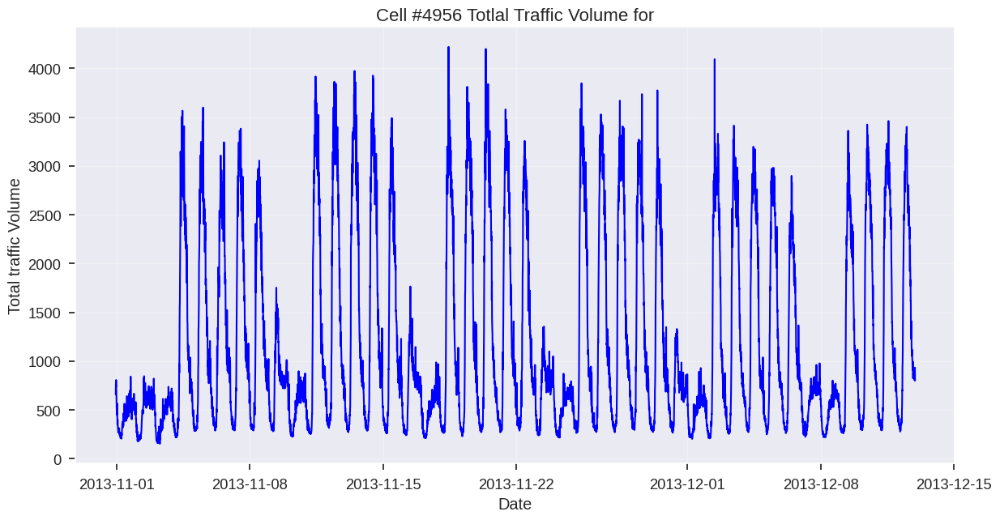

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(series_df, color='blue')
plt.title('Cell #4956 Totlal Traffic Volume for', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Total traffic Volume')
plt.grid(True, alpha=0.3)
plt.show()

### Observations

The time series appears seasonal with:

-   Primary seasonality: Daily

-   Secondary pattern: Weekly layered on top of the daily pattern.
    -   Drop Periods: correspond to weekends (consistent low traffic every 7 days).


### Confirm Seasonality Statistically

1. We use STL with period 24 as:
    - roubus to outliers.
    - handle non-stationary seasonality.
2. ACF to confrirm the 24-hrs lag cycle.
3. Kruskal-Wallis to statistically confirm traffic at different times (hours of the day) is significantly different.


#### Daily Seasonality


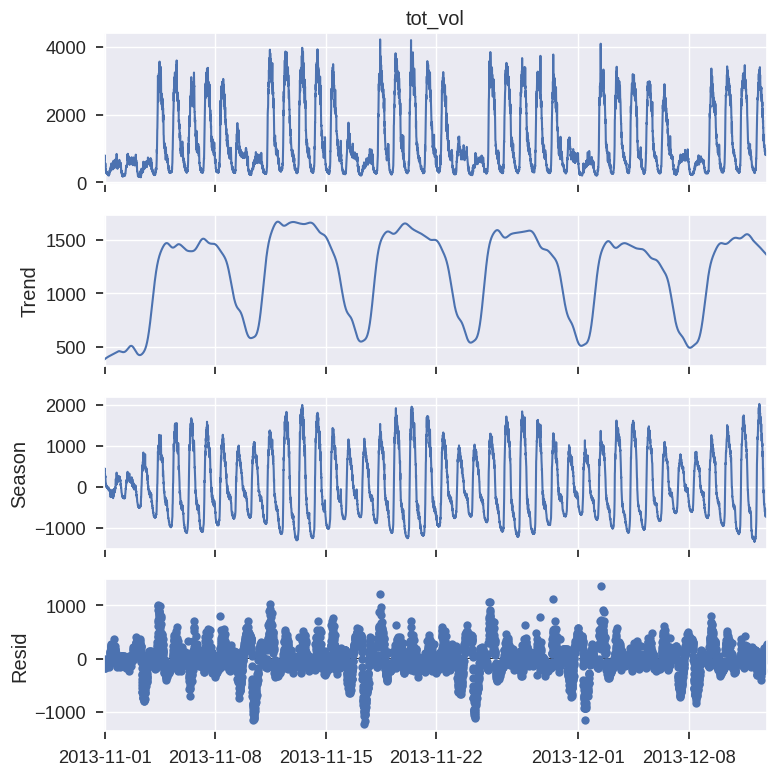

In [ ]:
from statsmodels.tsa.seasonal import STL

stl = STL(series_df[SeriesComp.VALUE.value], period=24*6)      # one day seasonality in 10-min interval data
res = stl.fit()
res.plot()
plt.show()

In [ ]:
# Seasonality Strength

seasonal_var = np.var(res.seasonal)
residual_var = np.var(res.resid)
strength = seasonal_var / (seasonal_var + residual_var)
print(f"Seasonality strength: {strength:.2f}")

Seasonality strength: 0.89


#### Observations:

-   Strong daily patterns.

-   **Trend**: shows weekly-like dips and recoveries:

    -   reflecting weekend effects (lower traffic on weekends).
    -   separating low-frequency trend variation from high-frequency daily cycles.

-   **Seasonality**: captures the core daily shape of the signal: - High peaks during active hours. - Lows during night/inactive hours.
    The amplitude of the seasonality seems mostly stable, with slight variation

-   **Residual**:
    -   Most values stay within a reasonable band, though some spikes suggest localized anomalies (e.g., special events, outages).

**Seasonality Strength Metric** shows a very strong seasonality of 89%.


### ACF

-   Daily datapoints = 144, lags of 200 is enough to capture the daily seasonality.


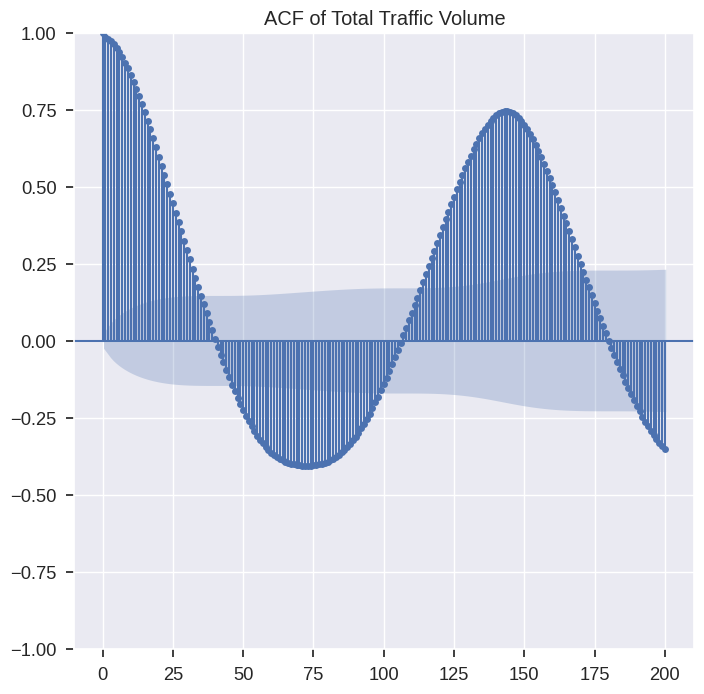

In [ ]:
plot_acf(series_df[SeriesComp.VALUE.value], lags=200)
plt.title("ACF of Total Traffic Volume")
plt.show()

-   First dip at lag 72 (~144/2): inverse correlation with data half a day apart.

-   Second strong positive peak at lag 144: confirms daily seasonality.

-   The repeating cosine-like pattern indicates regular, stable cycles.


### Kruskal-Wallis Test for Seasonality

To check if the distribution of values differs significantly between across hours of the day.


In [ ]:
new_series_df = series_df.copy()

# Create a column for hour of day (0 to 143)
new_series_df['time_of_day'] = (new_series_df.index.hour * 6) + (new_series_df.index.minute // 10)

# Group values by time_of_day
groups = [new_series_df[new_series_df['time_of_day'] == t][SeriesComp.VALUE.value].values for t in range(24*6)]

stat, p = kruskal(*groups)
print(f"Kruskal-Wallis statistic: {stat:.2f}, p-value: {p:.4e}")

Kruskal-Wallis statistic: 4148.50, p-value: 0.0000e+00


-   There are significant differences in total traffic volume across different times of day.

-   p < 0.05: we reject the null hypothesis that all time intervals have the same distribution.

-   Combined with STL and ACF, this strongly confirms daily seasonality from both:

    -   Statistical perspective.

    -   Visual perspective.


#### Weekly Seasonlity


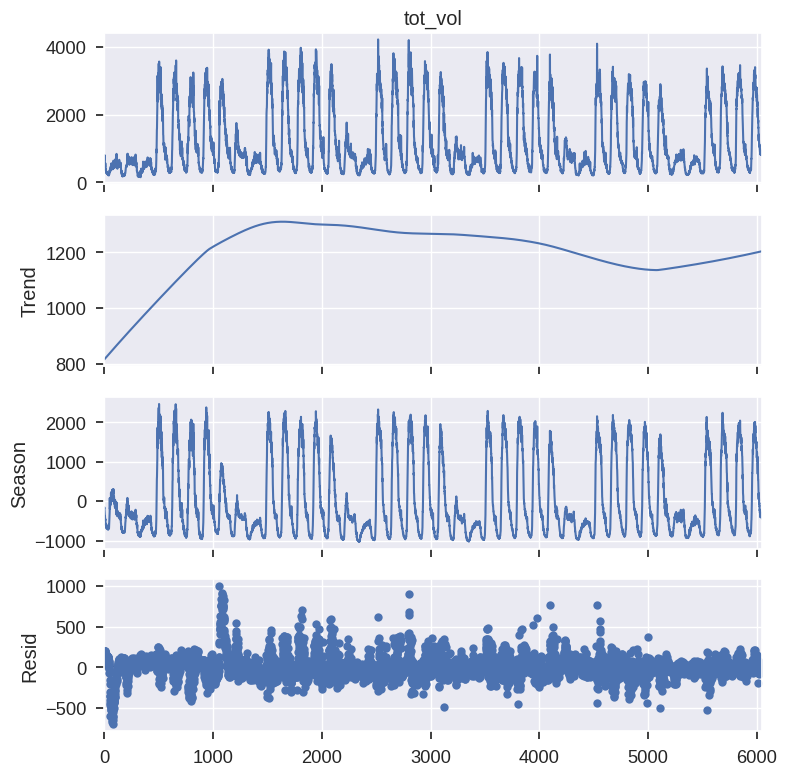

In [ ]:
stl = STL(df[SeriesComp.VALUE.value], period=24*6*7)      # one week seasonality in 10-min interval data
res = stl.fit()
res.plot()
plt.show()

In [ ]:
# Seasonality Strength

seasonal_var = np.var(res.seasonal)
residual_var = np.var(res.resid)
strength = seasonal_var / (seasonal_var + residual_var)
print(f"Seasonality strength: {strength:.2f}")

Seasonality strength: 0.98


#### Observations:

-   Strong repeating cycles, confirming regular daily behavior.

-   **Trend**:

    -   The trend component is much smoother now, since daily variations were absorbed by the seasonal component.
    -   Captures long-term drift.

-   **Seasonality**: captures weekly periodicity:

    -   strong weekly seasonal structure, on top of daily cycles.
    -   daily seasonality has been absorbed into the residuals.

-   **Residual**:
    -   Residuals remain mostly centered around zero.
    -   Spikes still occur.
    -   No visible autocorrelation or pattern: STL isolated seasonality perfectly.

**Seasonality Strength Metric** shows a very strong seasonality of 98%.


#### ACF Weekly

-   Daily datapoints = 1008, lags of 1100 is enough to capture the weekly seasonality.


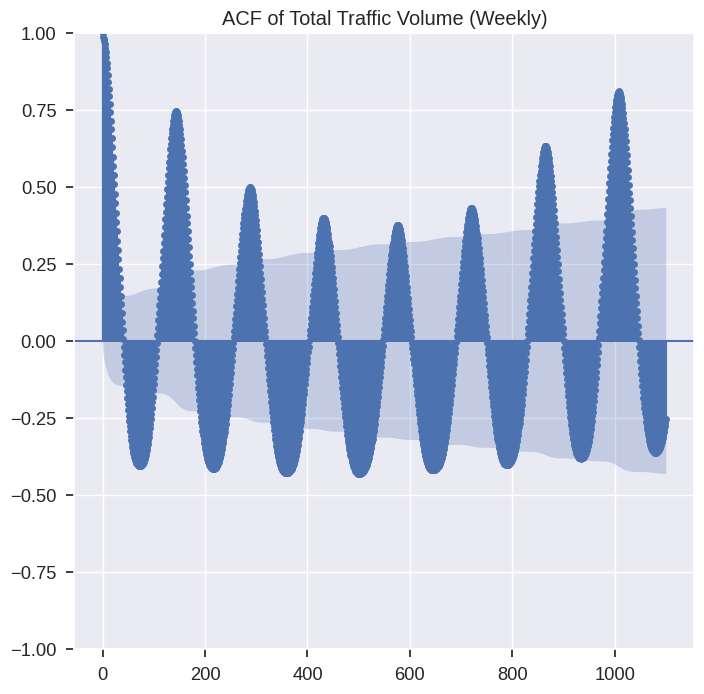

In [ ]:
plot_acf(series_df[SeriesComp.VALUE.value], lags=1100)
plt.title("ACF of Total Traffic Volume (Weekly)")
plt.show()

-   Strong, periodic spikes in autocorrelation: At lags: 0, 144, 288, 432, ..., up to 1008

-   The pattern repeats cleanly, with very high autocorrelation near lag 1008.


In [ ]:
new_series_df['day_of_week'] = new_series_df.index.dayofweek
groups = [new_series_df[new_series_df['day_of_week'] == d][SeriesComp.VALUE.value].values for d in range(7)]

stat, p = kruskal(*groups)
print(f"Kruskal-Wallis Weekly statistic: {stat:.2f}, p-value: {p:.4e}")

Kruskal-Wallis Weekly statistic: 909.11, p-value: 4.0276e-193


Now, confirming both daily and weekly seasonality


### Compined


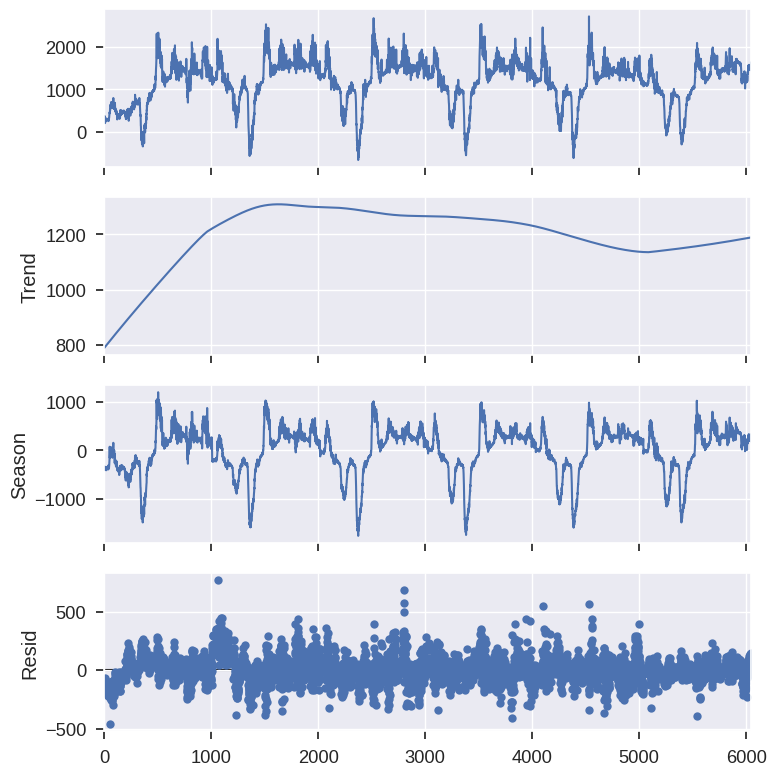

In [ ]:
stl_daily = STL(df[SeriesComp.VALUE.value], period=24*6).fit()
deseasonalized = df[SeriesComp.VALUE.value] - stl_daily.seasonal

stl_weekly = STL(deseasonalized, period=24*6*7).fit()
stl_weekly.plot()
plt.show()

While ACF shows correlation between a time series and its lagged values (including indirect effects), PACF shows the direct correlation with lags after removing the influence of intermediate lags.

-   PACF to determine how many past values directly influence the present → gives AR order p.

-   ACF to assess how much past noise/errors influence the current → helps with MA order q.


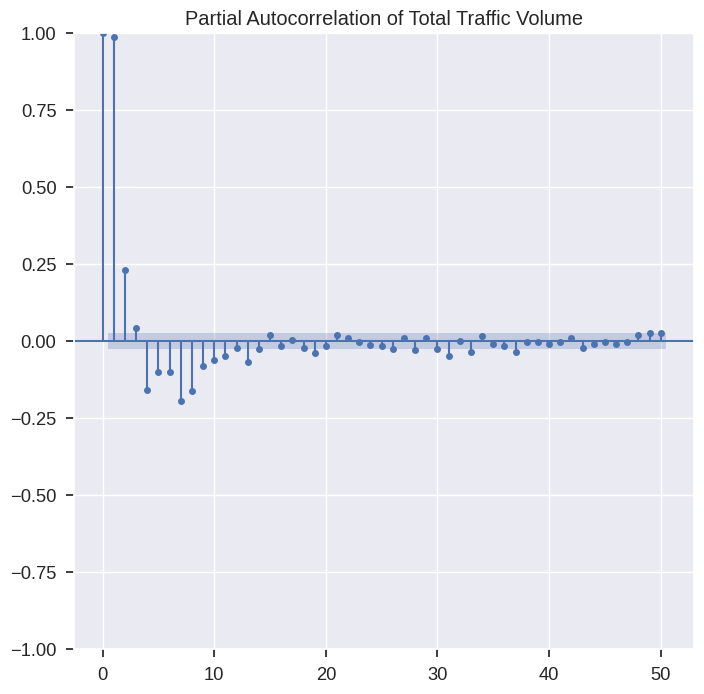

In [ ]:
plot_pacf(series_df[SeriesComp.VALUE.value], lags=50, method='ywm')
plt.title("Partial Autocorrelation of Total Traffic Volume")
plt.show()

-   Lag 1 and 2: Strong and significant spikes → high partial autocorrelation

-   Lag 3: Still slightly above confidence band

-   Beyond lag 4: Rapid decay, values mostly within confidence bounds

**Interpretation**:

-   There's significant short-term dependency up to lag 2-3
-   AR component p = 2 or 3.


## Stationary Test


In [ ]:
# Augmented Dickey-Fuller Test for Stationarity
def perform_adf_test(series, title):
    print(f"ADF Test for {title}:")
    result = adfuller(series.dropna())

    print(f'ADF Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4f}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value:.4f}')

    if result[1] < 0.05:
        print("Series is stationary (reject null hypothesis)")
    else:
        print("Series is non-stationary (fail to reject null hypothesis)")

In [ ]:
perform_adf_test(series_df[SeriesComp.VALUE.value], "Non-Stationary Series")
print("-"*30)

ADF Test for Non-Stationary Series:
ADF Statistic: -12.3021
p-value: 0.0000
Critical Values:
	1%: -3.4314
	5%: -2.8620
	10%: -2.5670
Series is stationary (reject null hypothesis)
------------------------------


-   series is likely trend-stationary with deterministic seasonal cycles.

-   To further confirm it, we apply stationarity test after removing daily seasonality.


In [ ]:
stat, p, *_ = adfuller(stl_daily.resid)
print(f"ADF on residuals: stat={stat:.2f}, p={p:.4e}")

ADF on residuals: stat=-13.32, p=6.4745e-25


still holds.


## Time Series Forecasting


In [ ]:
# performing gridsearch
from itertools import product

def arima_grid_search(time_series):
    p = d = q = range(0,3)
    param = list(product(p,d,q))

    best_aic = np.inf
    best_order = None
    best_arima_model = None

    for order in param:
        try:
            arima_model = ARIMA(time_series, order=order).fit()
            if arima_model.aic < best_aic:
                best_arima_model = arima_model
                best_order = order
                best_aic = arima_model.aic
        except:
            continue

    return best_arima_model, best_order, best_aic

### Train-test (4-2 weeks)


In [ ]:
TEST_COUNT = 6*12     # 12 hours

In [ ]:
train = series_df[:-TEST_COUNT]
test = series_df[-TEST_COUNT :]

In [ ]:
best_arima_model, best_order, best_aic = arima_grid_search(train)

In [ ]:
print(f"Best ARIMA order (p,d,q): {best_order} | AIC: {best_aic}")

Best ARIMA order (p,d,q): (2, 0, 2) | AIC: 76353.81262479528


In [ ]:
forecast = best_arima_model.forecast(steps=TEST_COUNT)
forecast = pd.Series(forecast, index=test.index)

In [ ]:
mae = mean_absolute_error(test, forecast)
rmse = root_mean_squared_error(test, forecast)

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 147.28
RMSE: 175.18


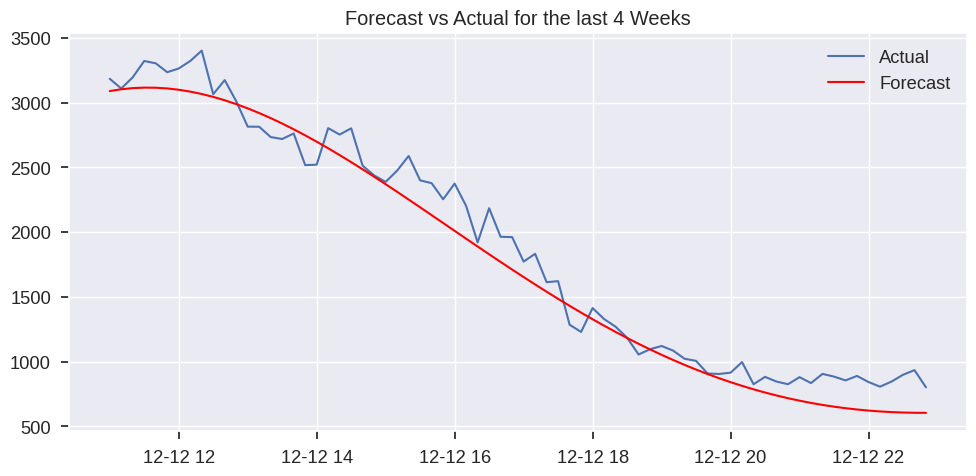

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(test, label='Actual')
plt.plot(forecast, label='Forecast', color='red')
plt.title('Forecast vs Actual for the last 12 hours')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
def compute_nrmse(y_true, y_pred):
    """
    y_true and y_pred must be numpy arrays of shape (samples, T_out, H, W)
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Flatten predictions and ground truth
    d_true = y_true.flatten()
    d_pred = y_pred.flatten()

    N = d_true.shape[0]
    d_mean = np.mean(d_true)

    rmse = np.sqrt(np.sum((d_pred - d_true) ** 2) / N)
    nrmse = rmse / d_mean

    return np.round(nrmse, 4)

In [ ]:
nmrse = compute_nrmse(test, forecast)

print(f"NRMSE: {nmrse}")

NRMSE: 0.0926
